## Time Series

Course with Kaggle.com

Outline follows with course. Objectives include:
- engineer features to model the major time series components (trends, seasons, and cycles),
- visualize time series with many kinds of time series plots,
- create forecasting hybrids that combine the strengths of complementary models, and
- adapt machine learning methods to a variety of forecasting tasks.

---


In [11]:
# Packages to load

import os
local_datapath = os.getcwd() + '/data/timeseries_jan2025'
from pathlib import Path


import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from xgboost import XGBRegressor

plt.style.use("seaborn-v0_8-whitegrid")
plt.rc("figure", autolayout=True, figsize=(11,4), titlesize=18, titleweight='bold')
plt.rc("axes", labelweight='bold', labelsize='large', titleweight='bold', titlesize=16, titlepad=10)
plot_params = dict(color="0.75", style=".-", markeredgecolor="0.25", markerfacecolor="0.25")

%config InlineBackend.figure_format = 'retina'


from warnings import simplefilter
simplefilter("ignore")


from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import LabelEncoder
from statsmodels.tsa.deterministic import CalendarFourier, DeterministicProcess
from scipy.signal import periodogram
from sklearn.model_selection import train_test_split
from statsmodels.graphics.tsaplots import plot_pacf
from sklearn.metrics import mean_squared_error, root_mean_squared_error
from sklearn.multioutput import MultiOutputRegressor, RegressorChain


### I. Linear Regression with Time Series

#### Background & Introduction

In [2]:
df = pd.read_csv(local_datapath +'/book_sales.csv',
                index_col='Date',
                parse_dates=['Date']).drop('Paperback', axis=1)

df.head()


,Hardcover
Date,
2000-04-01,139
2000-04-02,128
2000-04-03,172
2000-04-04,139
2000-04-05,191


Recall linear regression model for two features:

`target  =  weight_1 * feature_1  +  weight_2 * feature_2  +  bias`

Two feature types in time series:
- time-step
- lag



In [3]:
df['Time'] = np.arange(len(df.index))

df.head()

,Hardcover,Time
Date,,
2000-04-01,139,0
2000-04-02,128,1
2000-04-03,172,2
2000-04-04,139,3
2000-04-05,191,4


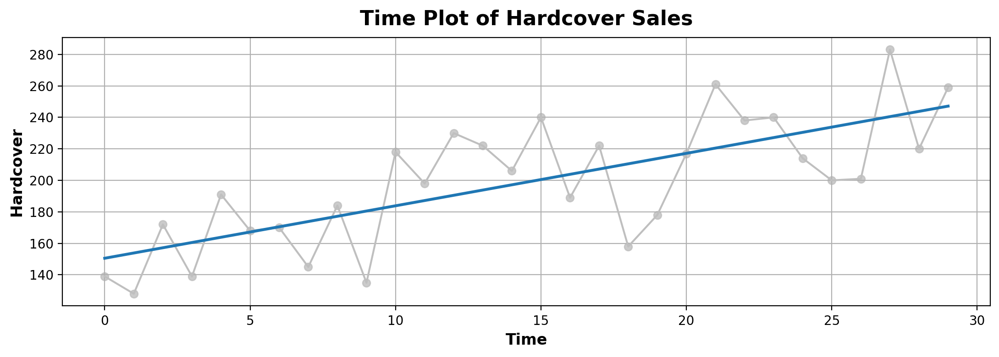

<Figure size 1100x400 with 0 Axes>

In [4]:
fig, ax = plt.subplots()

ax.plot('Time','Hardcover', data=df,color='0.75')

ax = sns.regplot(data=df,
                 x='Time', y='Hardcover',
                 ci=None,
                 scatter_kws = dict(color='0.75'))

ax.set_title('Time Plot of Hardcover Sales')
plt.grid('major')
plt.show()
plt.clf()

In [5]:
# Generate a 1-step lag feature
df['Lag_1'] = df.Hardcover.shift(1)

df2 = df.copy().reindex(columns=['Hardcover','Lag_1'])

df2.head()

,Hardcover,Lag_1
Date,,
2000-04-01,139,NaN
2000-04-02,128,139.0
2000-04-03,172,128.0
2000-04-04,139,172.0
2000-04-05,191,139.0


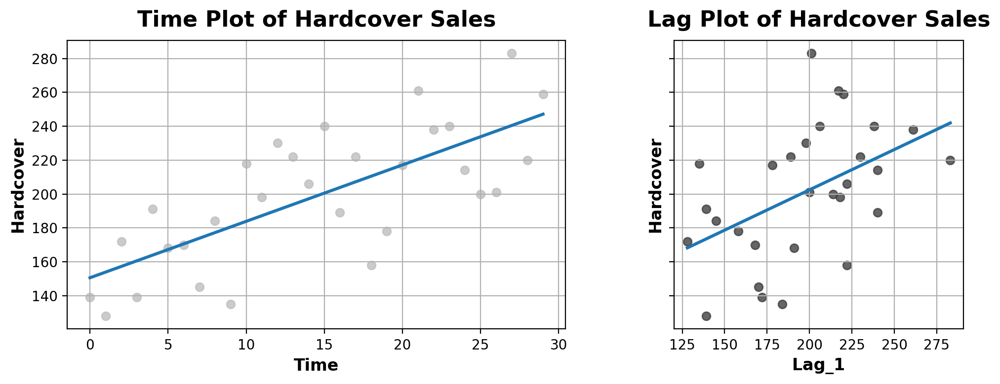

<Figure size 1100x400 with 0 Axes>

In [6]:
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, sharey=True)

sns.regplot(data=df,
                 x='Time', y='Hardcover',
                 ci=None,
                 scatter_kws = dict(color='0.75'), ax=ax1)
ax1.grid('major')
ax1.set_title('Time Plot of Hardcover Sales')

sns.regplot(data=df2,
                 x='Lag_1', y='Hardcover',
                 ci=None,
                 scatter_kws = dict(color='0.25'), ax=ax2)
ax2.set_aspect('equal')
ax2.set_title('Lag Plot of Hardcover Sales')
ax2.grid('major')

plt.tight_layout()
plt.show()
plt.clf()

del fig, ax1, ax2

In [7]:
del df, df2

#### Example: Tunnel Traffic

In [8]:
df = pd.read_csv(local_datapath +'/tunnel.csv',
                parse_dates=['Day']).set_index('Day')
df = df.to_period()
df.head()

,NumVehicles
Day,
2003-11-01,103536
2003-11-02,92051
2003-11-03,100795
2003-11-04,102352
2003-11-05,106569


In [9]:
df['Time'] = np.arange(len(df.index))
df.head()

,NumVehicles,Time
Day,,
2003-11-01,103536,0
2003-11-02,92051,1
2003-11-03,100795,2
2003-11-04,102352,3
2003-11-05,106569,4


In [10]:
X = df.loc[:, ['Time']]
y = df.loc[:, 'NumVehicles']


In [11]:
model = LinearRegression()
model.fit(X, y)


LinearRegression()

In [12]:
model.predict(X)[:10]

array([98176.20634409, 98198.70379363, 98221.20124316, 98243.69869269,
       98266.19614223, 98288.69359176, 98311.19104129, 98333.68849083,
       98356.18594036, 98378.68338989])

In [13]:
y_pred = pd.Series(model.predict(X),
                   index=X.index)


In [14]:
print(model.coef_)
print()
print(model.intercept_)

[22.49744953]

98176.20634409295


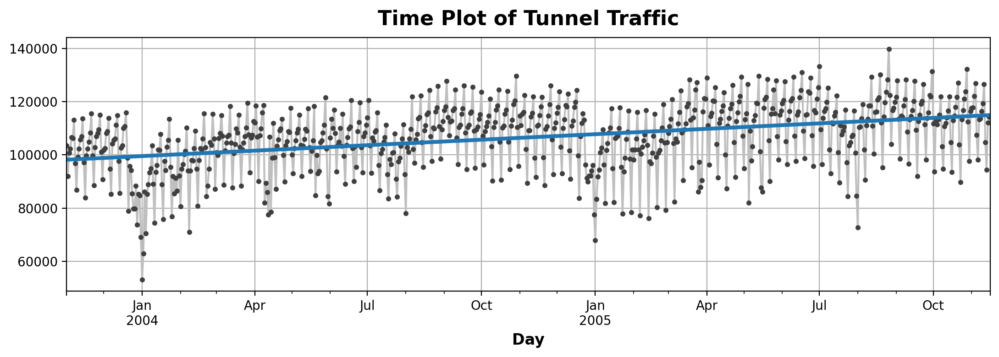

<Figure size 1100x400 with 0 Axes>

In [15]:
ax = y.plot(**plot_params)
ax = y_pred.plot(ax=ax, linewidth=3)
ax.set_title("Time Plot of Tunnel Traffic")

plt.grid()
plt.show()
plt.clf()

del ax

In [16]:
df['Lag_1'] = df.NumVehicles.shift(1)
df.head()

,NumVehicles,Time,Lag_1
Day,,,
2003-11-01,103536,0,NaN
2003-11-02,92051,1,103536.0
2003-11-03,100795,2,92051.0
2003-11-04,102352,3,100795.0
2003-11-05,106569,4,102352.0


In [17]:
X2 = df.loc[:, ['Lag_1']]
X2.dropna(inplace=True)
y2 = df.loc[:, 'NumVehicles']

y2, X2 = y2.align(X2, join='inner')


In [18]:
model2 = LinearRegression()
model2.fit(X2, y2)


LinearRegression()

In [19]:
y2_pred = pd.Series(model2.predict(X2), 
                    index=X2.index)


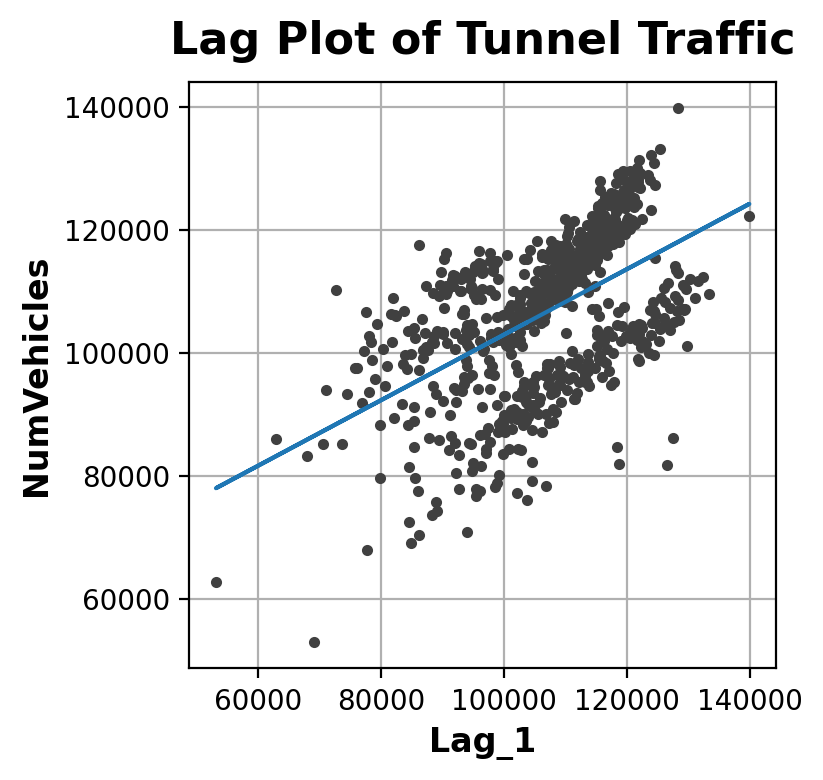

<Figure size 1100x400 with 0 Axes>

In [20]:
fig, ax = plt.subplots()

ax.plot(X2.Lag_1, y2, '.', color="0.25")

ax.plot(X2.Lag_1, y2_pred)

ax.set_aspect("equal")
ax.set_ylabel("NumVehicles")
ax.set_xlabel("Lag_1")
ax.set_title("Lag Plot of Tunnel Traffic")

plt.grid()
plt.show()
plt.clf()
del ax

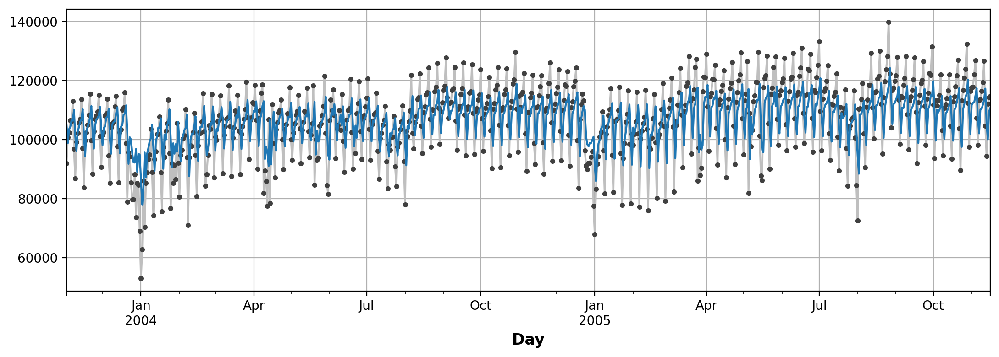

<Figure size 1100x400 with 0 Axes>

In [21]:
ax = y2.plot(**plot_params)
ax = y2_pred.plot()
plt.grid()
plt.show()
plt.clf()
del ax

In [22]:
del df, X, y, X2, y2, y_pred, y2_pred, model, model2

#### Exercise: Average Store Sales

In [23]:
df = pd.read_csv(local_datapath +'/train.csv',
                parse_dates=['date'],
                infer_datetime_format=True).set_index('date').to_period('D')

df = df.set_index(['store_nbr','family'], append=True)

average_sales = df.copy().groupby('date').mean()['sales']
del df

average_sales.head(20)

date
2013-01-01      1.409438
2013-01-02    278.390807
2013-01-03    202.840197
2013-01-04    198.911154
2013-01-05    267.873244
2013-01-06    291.636028
2013-01-07    188.621100
2013-01-08    178.646340
2013-01-09    169.770375
2013-01-10    145.332213
2013-01-11    162.591294
2013-01-12    226.295293
2013-01-13    260.739926
2013-01-14    164.617487
2013-01-15    167.861700
2013-01-16    178.646416
2013-01-17    150.111401
2013-01-18    166.178928
2013-01-19    242.682296
2013-01-20    258.749936
Freq: D, Name: sales, dtype: float64

In [24]:
df = average_sales.to_frame()
df['time'] = np.arange(len(df.index))

df.head()

,sales,time
date,,
2013-01-01,1.409438,0
2013-01-02,278.390807,1
2013-01-03,202.840197,2
2013-01-04,198.911154,3
2013-01-05,267.873244,4


In [25]:
X1 = df.loc[:, ['time']]
y1 = df.loc[:, 'sales']

model1 = LinearRegression()
model1.fit(X1, y1)


LinearRegression()

In [26]:
y1_preds = pd.Series(model1.predict(X1), index=X1.index)


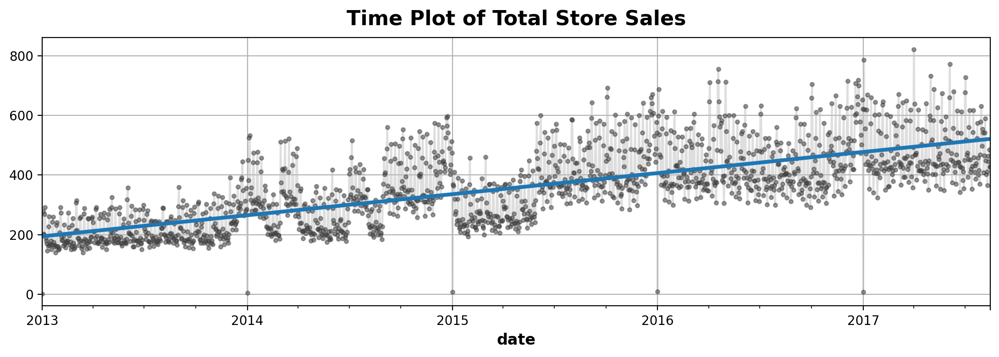

<Figure size 1100x400 with 0 Axes>

In [27]:
ax = y1.plot(**plot_params, alpha=0.5)
ax = y1_preds.plot(ax=ax, linewidth=3)
ax.set_title('Time Plot of Total Store Sales')

plt.grid()
plt.show()
plt.clf()
del ax


In [28]:
df['lag_01'] = df.sales.shift(1)

X2 = df.loc[:, ['lag_01']].dropna()
y2 = df.loc[:, 'sales']
y2, X2 = y2.align(X2, join='inner')

model2 = LinearRegression()
model2.fit(X2, y2)

LinearRegression()

In [29]:
y2_preds = pd.Series(model2.predict(X2), index=X2.index)


In [30]:
print("Time/Sales model")
print(model1.coef_)
print(model1.intercept_)
print('-'*25)
print()
print("Lag by shift=1/Sales model")
print(model2.coef_)
print(model2.intercept_)
print('-'*25)

Time/Sales model
[0.19434695]
194.23279017448934
-------------------------

Lag by shift=1/Sales model
[0.76527353]
84.22310525382778
-------------------------


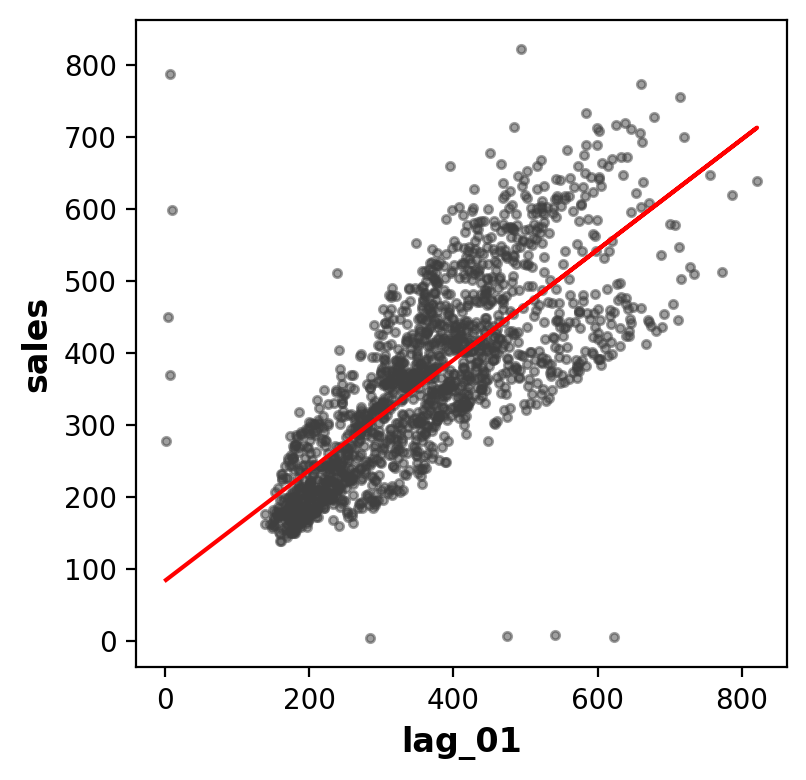

<Figure size 1100x400 with 0 Axes>

In [31]:
fig, ax = plt.subplots()

ax.plot(X2['lag_01'], y2, '.', color="0.25", alpha=0.50)
ax.plot(X2['lag_01'], y2_preds, color='red')

ax.set(aspect="equal", ylabel="sales", xlabel="lag_01")

plt.show()
plt.clf()
del ax

In [32]:
del average_sales, df, X1, y1, y1_preds, model1, X2, y2, y2_preds, model2

---

### II. Trend

#### Background & Introduction

In [55]:
# Re-use the Tunnel Traffic data

tunnel = pd.read_csv(local_datapath +'/tunnel.csv',
                parse_dates=['Day']).set_index('Day')
tunnel = tunnel.to_period()
tunnel.head()

,NumVehicles
Day,
2003-11-01,103536
2003-11-02,92051
2003-11-03,100795
2003-11-04,102352
2003-11-05,106569


In [56]:
moving_avg = tunnel.rolling(window=365,
                            center=True,
                            min_periods=183).mean()
moving_avg

,NumVehicles
Day,
2003-11-01,99127.426230
2003-11-02,99094.489130
2003-11-03,99112.481081
2003-11-04,99146.639785
2003-11-05,99196.122995
...,...
2005-11-12,112995.689840
2005-11-13,113058.763441
2005-11-14,113195.718919


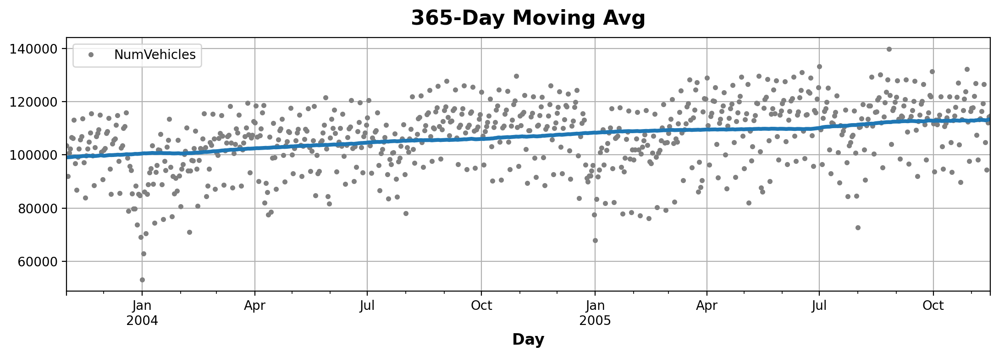

<Figure size 1100x400 with 0 Axes>

In [57]:
ax = tunnel.plot(style='.', color="0.5")
moving_avg.plot(ax=ax,
                linewidth=3,
                title="365-Day Moving Avg",
                legend=False)
plt.grid()
plt.show()
plt.clf()
del ax

In [58]:
dp = DeterministicProcess(index = tunnel.index,
                          constant = True,
                          order = 1,
                          drop = True)

X = dp.in_sample()

X.head()

,const,trend
Day,,
2003-11-01,1.0,1.0
2003-11-02,1.0,2.0
2003-11-03,1.0,3.0
2003-11-04,1.0,4.0
2003-11-05,1.0,5.0


In [59]:
y = tunnel.NumVehicles

model = LinearRegression(fit_intercept = False)

model.fit(X, y)

y_pred = pd.Series(model.predict(X), 
                   index = X.index)


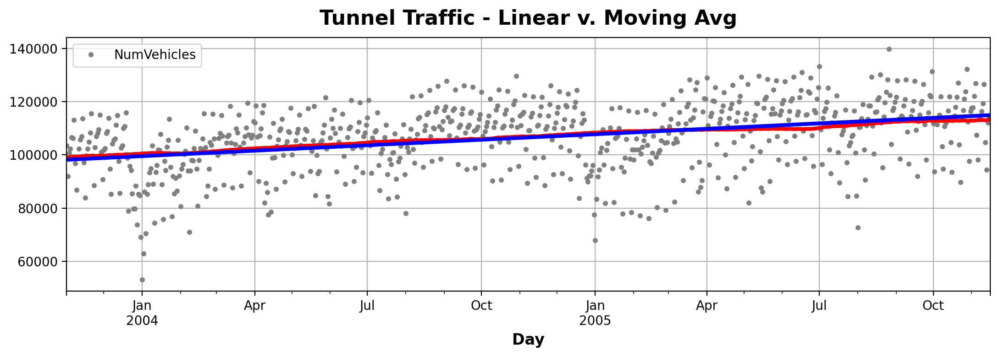

<Figure size 1100x400 with 0 Axes>

In [60]:
ax = tunnel.plot(style = '.',
                 color = '0.5',
                 title = 'Tunnel Traffic - Linear v. Moving Avg')

a = moving_avg.plot(ax=ax,
                linewidth=3,
                legend=False,
                color="red")

b = y_pred.plot(ax = ax,
                linewidth = 3,
                legend=False,
                color="blue")

plt.grid()
plt.show()
plt.clf()
del ax, a, b

In [61]:
# Generate a Forecast

X       = dp.out_of_sample(steps=30)
y_fcast = pd.Series(model.predict(X), index=X.index)


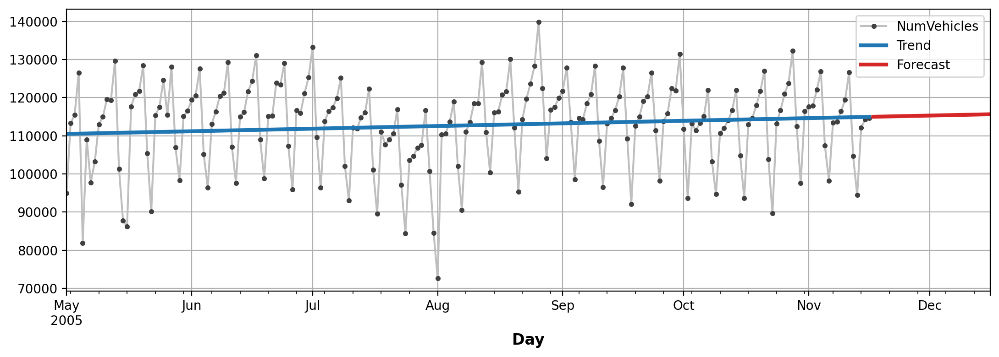

<Figure size 1100x400 with 0 Axes>

In [62]:
ax = tunnel["2005-05": ].plot(**plot_params)

ax = y_pred["2005-05": ].plot(ax = ax,
                              linewidth = 3,
                              label = "Trend")

ax = y_fcast.plot(ax = ax,
                  linewidth = 3,
                  label = "Forecast", color = "C3")
_ = ax.legend()

plt.grid()
plt.show()
plt.clf()

del ax, _

In [ ]:
del tunnel, X, y, y_pred, y_fcast, dp, moving_avg, model

#### Exercise: Return to the average sales data

In [64]:
dtype = {
    'store_nbr': 'category',
    'family': 'category',
    'sales': 'float32',
    'onpromotion': 'uint64',
}

df = pd.read_csv(local_datapath +'/train.csv', dtype=dtype,
                parse_dates=['date'],
                infer_datetime_format=True).set_index('date').to_period('D')
del dtype

df = df.set_index(['store_nbr','family'], append=True)

average_sales = df.copy().groupby('date').mean()['sales']
del df

# -----------------

retail_sales = pd.read_csv(
    local_datapath + "/us-retail-sales.csv",
    parse_dates=['Month'],
    index_col='Month').to_period('D')
food_sales = retail_sales.loc[:, 'FoodAndBeverage']
auto_sales = retail_sales.loc[:, 'Automobiles']


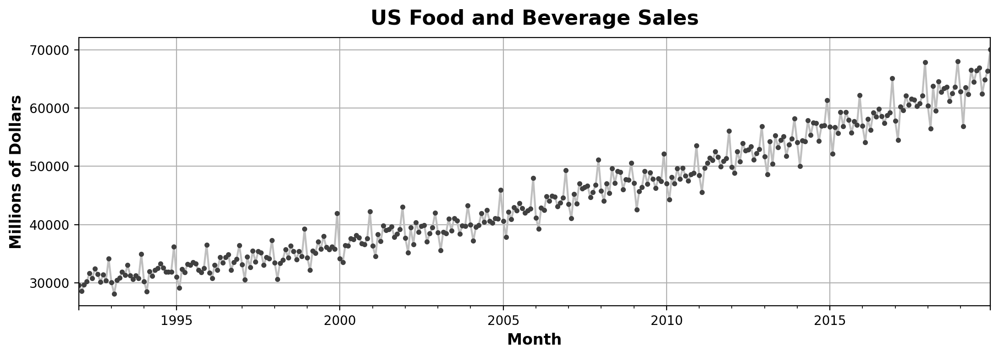

<Figure size 1100x400 with 0 Axes>

In [65]:
ax = food_sales.plot(**plot_params)
ax.set(title="US Food and Beverage Sales", ylabel="Millions of Dollars");
plt.grid()
plt.show()
plt.clf()
del ax

In [66]:
trend = food_sales.rolling(window=12, center=True, min_periods=6).mean().to_frame()

trend.head()

,FoodAndBeverage
Month,
1992-01-01,30085.833333
1992-02-01,30416.714286
1992-03-01,30548.250000
1992-04-01,30505.333333
1992-05-01,30595.500000


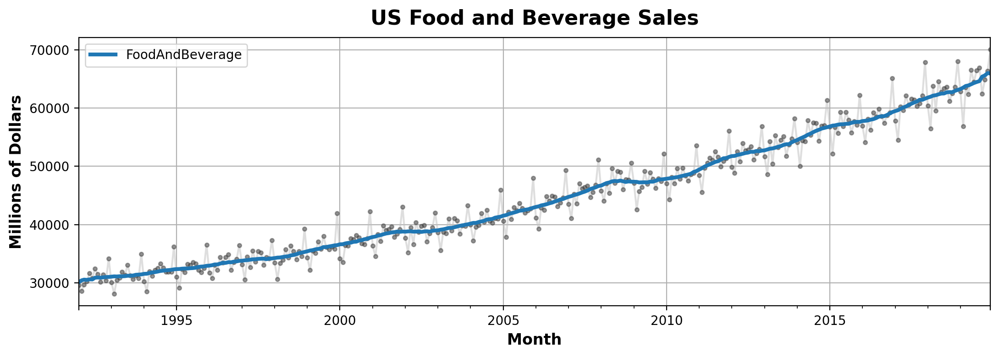

<Figure size 1100x400 with 0 Axes>

In [67]:
ax = food_sales.plot(**plot_params, alpha=0.50)
ax.set(title="US Food and Beverage Sales", ylabel="Millions of Dollars")

ax = trend.plot(ax = ax, linewidth = 3)

plt.grid()
plt.show()
plt.clf()
del ax

In [68]:
del trend, retail_sales, food_sales, auto_sales


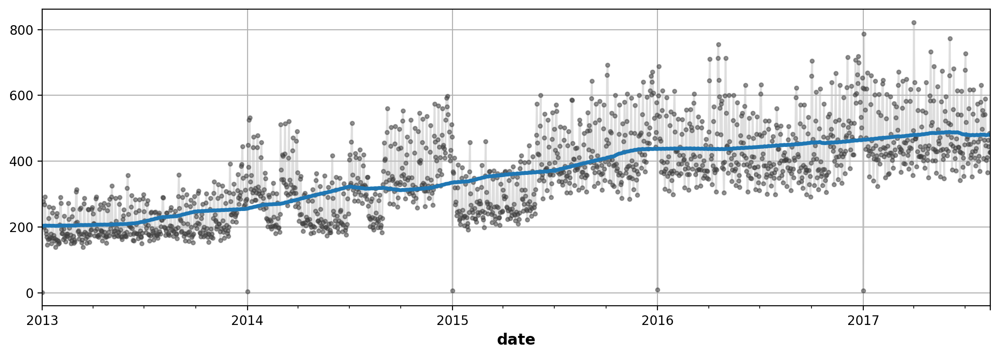

<Figure size 1100x400 with 0 Axes>

In [69]:
trend = average_sales.rolling(window=365, center=True, min_periods=183).mean()

ax = average_sales.plot(**plot_params, alpha=0.50)
ax = trend.plot(ax = ax, linewidth = 3)
plt.grid()
plt.show()
plt.clf()
del ax


In [70]:
dp = DeterministicProcess(index = average_sales.index,
                          constant = False,
                          order = 3,
                          drop = True)

X       = dp.in_sample()
X_fcast = dp.out_of_sample(steps=90)


In [71]:
average_sales.to_frame().sales

date
2013-01-01      1.409438
2013-01-02    278.390808
2013-01-03    202.840195
2013-01-04    198.911163
2013-01-05    267.873260
                 ...    
2017-08-11    463.733856
2017-08-12    444.798309
2017-08-13    485.768616
2017-08-14    427.004730
2017-08-15    427.980896
Freq: D, Name: sales, Length: 1684, dtype: float32

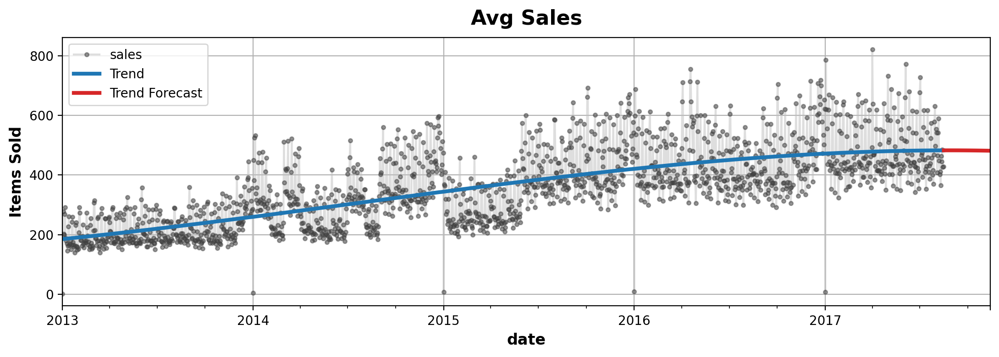

<Figure size 1100x400 with 0 Axes>

In [72]:
model = LinearRegression()
model.fit(X, average_sales)

y_pred  = pd.Series(model.predict(X), index=X.index)
y_fcast = pd.Series(model.predict(X_fcast), index=X_fcast.index)

ax = average_sales.plot(**plot_params, alpha=0.50, title="Avg Sales", ylabel="Items Sold")
ax = y_pred.plot(ax = ax, 
                 linewidth = 3, label="Trend", color="C0")
ax = y_fcast.plot(ax = ax,
                  linewidth = 3, label="Trend Forecast", color="C3")
ax.legend()

plt.grid()
plt.show()
plt.clf()

del ax

In [73]:
dp = DeterministicProcess(index = average_sales.index,
                          order = 11)
X  = dp.in_sample()

model = LinearRegression()
model.fit(X, average_sales)

y_pred = pd.Series(model.predict(X),
                   index=X.index)

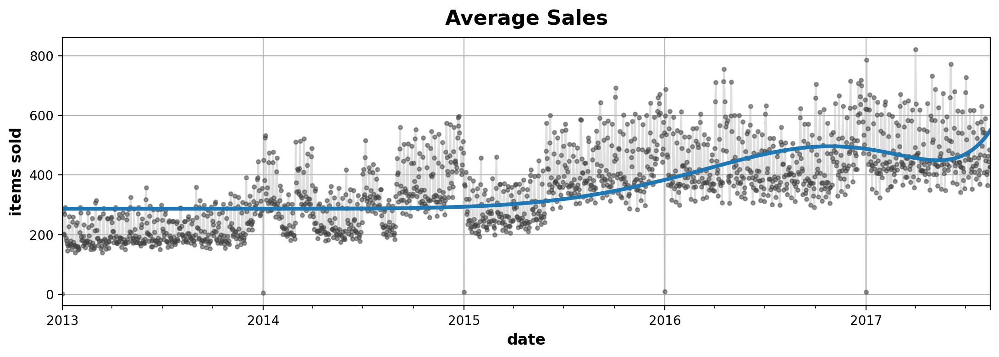

<Figure size 1100x400 with 0 Axes>

In [74]:
ax = average_sales.plot(**plot_params, alpha=0.50, title="Average Sales", ylabel="items sold")
ax = y_pred.plot(ax = ax, linewidth = 3, label="Trend", color='C0')

plt.grid()
plt.show()
plt.clf()
del ax

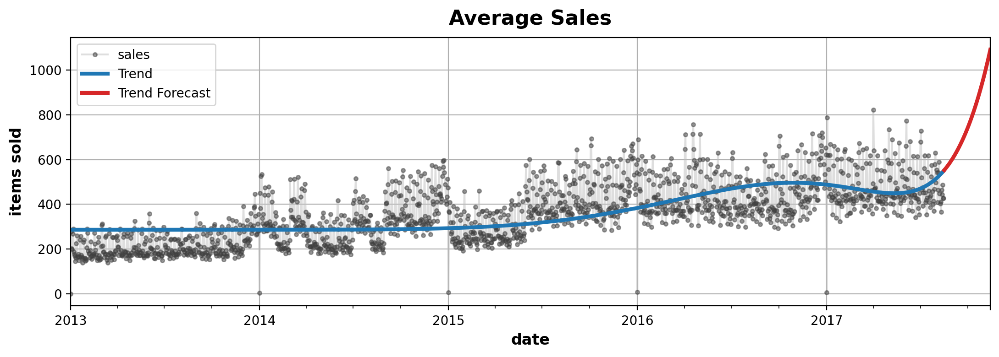

<Figure size 1100x400 with 0 Axes>

In [75]:
X_fcast = dp.out_of_sample(steps=90)
y_fcast = pd.Series(model.predict(X_fcast), index=X_fcast.index)

ax = average_sales.plot(**plot_params, alpha=0.5, title="Average Sales", ylabel="items sold")
ax = y_pred.plot(ax=ax, 
                 linewidth=3, label="Trend", color='C0')
ax = y_fcast.plot(ax=ax, 
                  linewidth=3, label="Trend Forecast", color='C3')
ax.legend()

plt.grid()
plt.show()
plt.clf()
del ax

In [76]:
del dp, model, trend, X, X_fcast, y_pred, y_fcast
del average_sales

---

### III. Model Seasonality

#### Background & Introduction


In [77]:
# work with Fourier pairs and Fourier features

def fourier_features(index, frequency, order):
    time = np.arange(len(index), dtype = np.float32)
    k = 2*np.pi*(1/frequency)*time
    features = {}
    for i in range(1, order+1):
        features.update({f"sin_{frequency}_{i}": np.sin(i*k),
                         f"cos_{frequency}_{i}": np.cos(i*k)})
    return ps.DataFrame(features, index=index)


def seasonal_plot(X, y, period, frequency, ax=None):
    import seaborn as sns
    if ax is None:
        _, ax = plt.subplots()
    palette = sns.color_palette("husl", n_colors = X[period].nunique())
    ax = sns.lineplot(data=X, x=frequency, y=y,
                      hue=period, ci=False, palette=palette, legend=False)
    ax.set_title(f"Seasonal Plot ({period}/{frequency})")
    for line, name in zip(ax.lines, X[period].unique()):
        y_ = line.get_ydata()[-1]
        ax.annotate(name, xy=(1, y_), xytext=(6,0),color=line.get_color(), 
                    xycoords=ax.get_yaxis_transform(), textcoords="offset points",
                    size=14, va='center')
    return ax


def plot_periodogram(ts, detrend='linear', ax=None):
    from scipy.signal import periodogram
    fs = pd.Timedelta("365D") / pd.Timedelta("1D")
    freqencies, spectrum = periodogram(ts, fs=fs, detrend=detrend,
                                       window="boxcar",scaling='spectrum')
    if ax is None:
        _, ax = plt.subplots()
    ax.step(freqencies, spectrum, color="purple")
    ax.set_xscale("log")
    ax.set_xticks([1, 2, 4, 6, 12, 26, 52, 104])
    ax.set_xticklabels(["Annual (1)",
            "Semiannual (2)",
            "Quarterly (4)",
            "Bimonthly (6)",
            "Monthly (12)",
            "Biweekly (26)",
            "Weekly (52)",
            "Semiweekly (104)"], rotation=30)
    ax.ticklabel_format(axis="y", style="sci", scilimits=(0, 0))
    ax.set_ylabel("Variance")
    ax.set_title("Periodogram")
    return ax



In [78]:
tunnel = pd.read_csv(local_datapath +'/tunnel.csv',
                parse_dates=['Day']).set_index('Day')
tunnel = tunnel.to_period("D")

tunnel.head()

,NumVehicles
Day,
2003-11-01,103536
2003-11-02,92051
2003-11-03,100795
2003-11-04,102352
2003-11-05,106569


<Axes: title={'center': 'Seasonal Plot (year/dayofyear)'}, xlabel='dayofyear', ylabel='NumVehicles'>

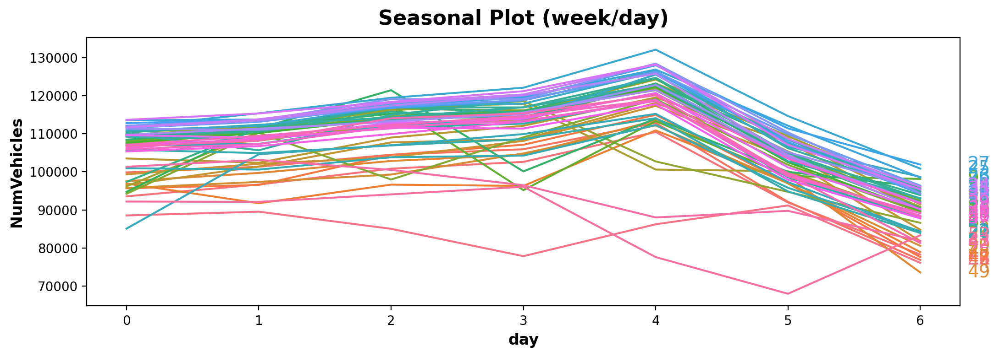

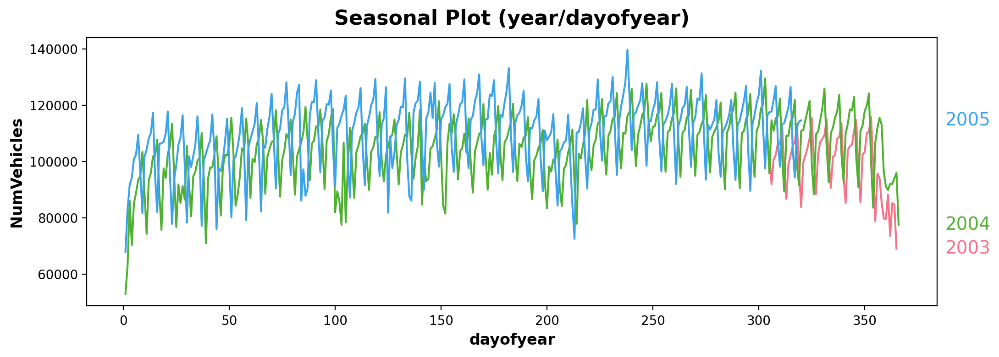

In [79]:
X = tunnel.copy()
X['day']       = X.index.dayofweek
X['week']      = X.index.week
X['dayofyear'] = X.index.dayofyear
X['year']      = X.index.year

seasonal_plot(X, y="NumVehicles", period="week", frequency="day", ax=None)

seasonal_plot(X, y="NumVehicles", period="year", frequency="dayofyear", ax=None)


<Axes: title={'center': 'Periodogram'}, ylabel='Variance'>

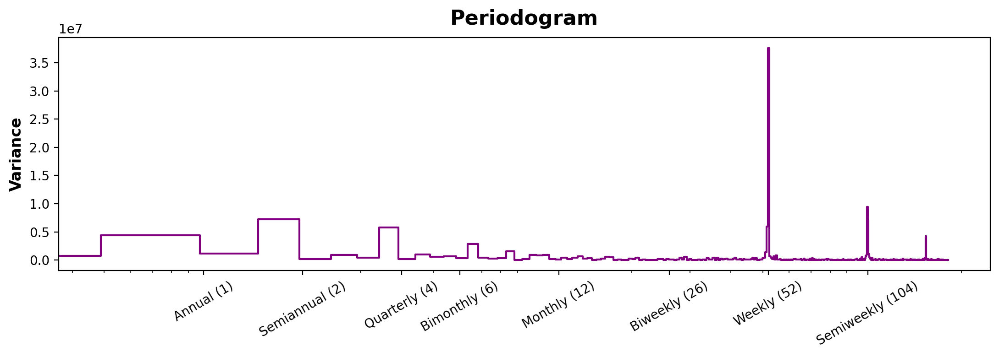

In [80]:
plot_periodogram(tunnel.NumVehicles)

In [81]:
fourier = CalendarFourier(freq = "A",
                          order = 10)

dp = DeterministicProcess(index = tunnel.index,
                          constant = True,
                          order = 1,
                          seasonal = True,
                          additional_terms = [fourier],
                          drop = True)

X = dp.in_sample()
X

,const,trend,"s(2,7)","s(3,7)","s(4,7)","s(5,7)","s(6,7)","s(7,7)","sin(1,freq=YE-DEC)","cos(1,freq=YE-DEC)",...,"sin(6,freq=YE-DEC)","cos(6,freq=YE-DEC)","sin(7,freq=YE-DEC)","cos(7,freq=YE-DEC)","sin(8,freq=YE-DEC)","cos(8,freq=YE-DEC)","sin(9,freq=YE-DEC)","cos(9,freq=YE-DEC)","sin(10,freq=YE-DEC)","cos(10,freq=YE-DEC)"
Day,,,,,,,,,,,,,,,,,,,,,
2003-11-01,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.867456,0.497513,...,-0.017213,0.999852,-0.875892,0.482508,-0.854322,-0.519744,0.025818,-0.999667,0.880012,-0.474951
2003-11-02,1.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.858764,0.512371,...,0.085965,0.996298,-0.811539,0.584298,-0.917584,-0.397543,-0.128748,-0.991677,0.785650,-0.618671
2003-11-03,1.0,3.0,0.0,1.0,0.0,0.0,0.0,0.0,-0.849817,0.527078,...,0.188227,0.982126,-0.735417,0.677615,-0.963471,-0.267814,-0.280231,-0.959933,0.668064,-0.744104
2003-11-04,1.0,4.0,0.0,0.0,1.0,0.0,0.0,0.0,-0.840618,0.541628,...,0.288482,0.957485,-0.648630,0.761104,-0.991114,-0.133015,-0.425000,-0.905193,0.530730,-0.847541
2003-11-05,1.0,5.0,0.0,0.0,0.0,1.0,0.0,0.0,-0.831171,0.556017,...,0.385663,0.922640,-0.552435,0.833556,-0.999991,0.004304,-0.559589,-0.828770,0.377708,-0.925925
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2005-11-12,1.0,743.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.758306,0.651899,...,0.899631,0.436651,0.255353,0.966848,-0.566702,0.823923,-0.994218,0.107381,-0.729558,-0.683919
2005-11-13,1.0,744.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.746972,0.664855,...,0.939856,0.341571,0.369725,0.929141,-0.448229,0.893919,-0.965740,0.259512,-0.835925,-0.548843
2005-11-14,1.0,745.0,0.0,1.0,0.0,0.0,0.0,0.0,-0.735417,0.677615,...,0.970064,0.242850,0.478734,0.877960,-0.321270,0.946988,-0.914128,0.405426,-0.917584,-0.397543


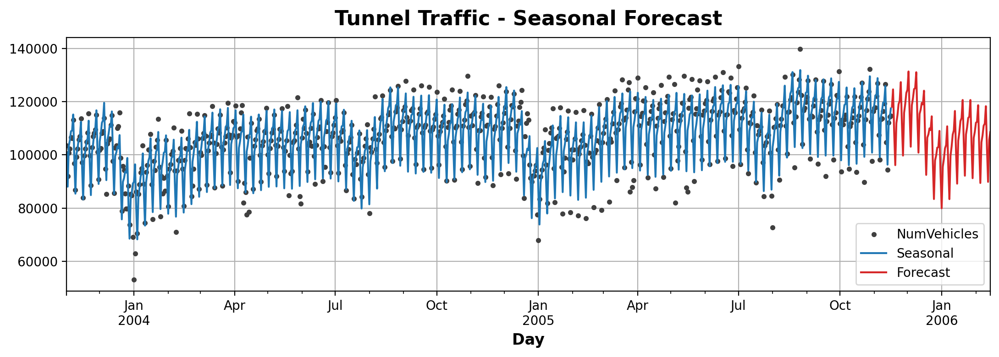

<Figure size 1100x400 with 0 Axes>

In [82]:
y = tunnel.NumVehicles

model = LinearRegression(fit_intercept = False)
_ = model.fit(X, y)

y_pred = pd.Series(model.predict(X), index=X.index)
X_fcst = dp.out_of_sample(steps=90)
y_fcst = pd.Series(model.predict(X_fcst), index=X_fcst.index)

ax = y.plot(color='0.25', style='.', title='Tunnel Traffic - Seasonal Forecast')
ax = y_pred.plot(ax=ax,
                 label="Seasonal")
ax = y_fcst.plot(ax=ax,
                  label='Forecast', color='C3')
_ = ax.legend()

plt.grid()
plt.show()
plt.clf()

del ax, _


In [83]:
del dp, fourier
del model

del X, X_fcst, y, y_fcst, y_pred

del tunnel

#### Exercise: 

In [84]:
holiday_events = pd.read_csv(local_datapath + '/holidays_events.csv',
                             dtype={'type': 'category',
                                    'locale': 'category',
                                    'locale_name': 'category',
                                    'description': 'category',
                                    'transferred': 'bool'},
                            parse_dates=['date'],
                            infer_datetime_format=True).set_index("date").to_period("D")

# -----------------------------------------------------------------------------------------

store_sales = pd.read_csv(local_datapath +'/train.csv', 
                          usecols = ['store_nbr','family','date','sales'],
                          dtype={'store_nbr': 'category',
                                 'family': 'category',
                                 'sales': 'float32'}, 
                        parse_dates=['date'],
                        infer_datetime_format=True)
store_sales.date = store_sales.date.dt.to_period('D')
store_sales      = store_sales.set_index(['store_nbr','family','date']).sort_index()
average_sales    = (store_sales.groupby('date').mean().squeeze().loc['2017'])


In [85]:
store_sales.head()

sales
store_nbr family     date             
1         AUTOMOTIVE 2013-01-01    0.0
                     2013-01-02    2.0
                     2013-01-03    3.0
                     2013-01-04    3.0
                     2013-01-05    5.0

<Axes: title={'center': 'Seasonal Plot (week/day)'}, xlabel='day', ylabel='sales'>

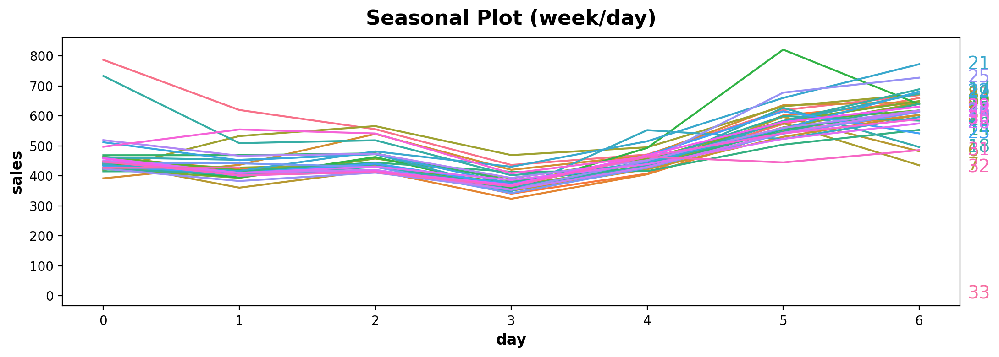

In [86]:
X = average_sales.to_frame()

X['week'] = X.index.week
X['day']  = X.index.dayofweek

seasonal_plot(X, y='sales', period='week', frequency='day')


<Axes: title={'center': 'Periodogram'}, ylabel='Variance'>

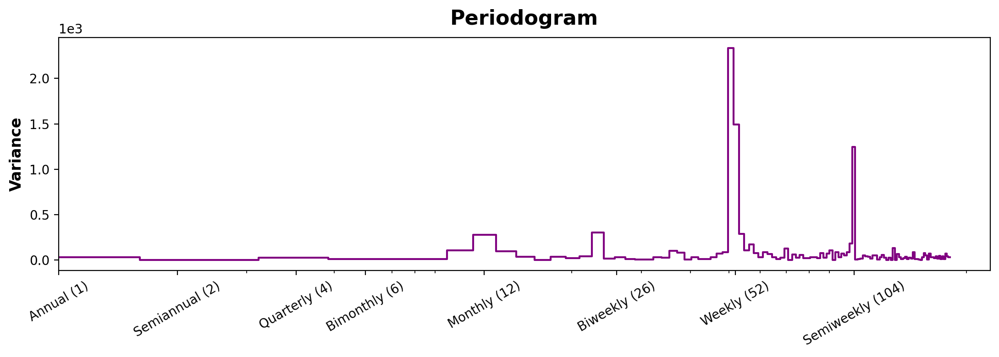

In [87]:
plot_periodogram(average_sales)

In [88]:
y = average_sales.copy()

fourier = CalendarFourier(freq = "M", 
                          order = 4)
dp      = DeterministicProcess(index = y.index,
                               constant = True,
                               order = 1,
                               seasonal = True,
                               additional_terms = [fourier],
                               drop = True)
X = dp.in_sample()
X

,const,trend,"s(2,7)","s(3,7)","s(4,7)","s(5,7)","s(6,7)","s(7,7)","sin(1,freq=ME)","cos(1,freq=ME)","sin(2,freq=ME)","cos(2,freq=ME)","sin(3,freq=ME)","cos(3,freq=ME)","sin(4,freq=ME)","cos(4,freq=ME)"
date,,,,,,,,,,,,,,,,
2017-01-01,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000
2017-01-02,1.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.201299,0.979530,0.394356,0.918958,0.571268,0.820763,0.724793,0.688967
2017-01-03,1.0,3.0,0.0,1.0,0.0,0.0,0.0,0.0,0.394356,0.918958,0.724793,0.688967,0.937752,0.347305,0.998717,-0.050649
2017-01-04,1.0,4.0,0.0,0.0,1.0,0.0,0.0,0.0,0.571268,0.820763,0.937752,0.347305,0.968077,-0.250653,0.651372,-0.758758
2017-01-05,1.0,5.0,0.0,0.0,0.0,1.0,0.0,0.0,0.724793,0.688967,0.998717,-0.050649,0.651372,-0.758758,-0.101168,-0.994869
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-08-11,1.0,223.0,0.0,0.0,0.0,0.0,1.0,0.0,0.897805,-0.440394,-0.790776,-0.612106,-0.201299,0.979530,0.968077,-0.250653
2017-08-12,1.0,224.0,0.0,0.0,0.0,0.0,0.0,1.0,0.790776,-0.612106,-0.968077,-0.250653,0.394356,0.918958,0.485302,-0.874347
2017-08-13,1.0,225.0,0.0,0.0,0.0,0.0,0.0,0.0,0.651372,-0.758758,-0.988468,0.151428,0.848644,0.528964,-0.299363,-0.954139


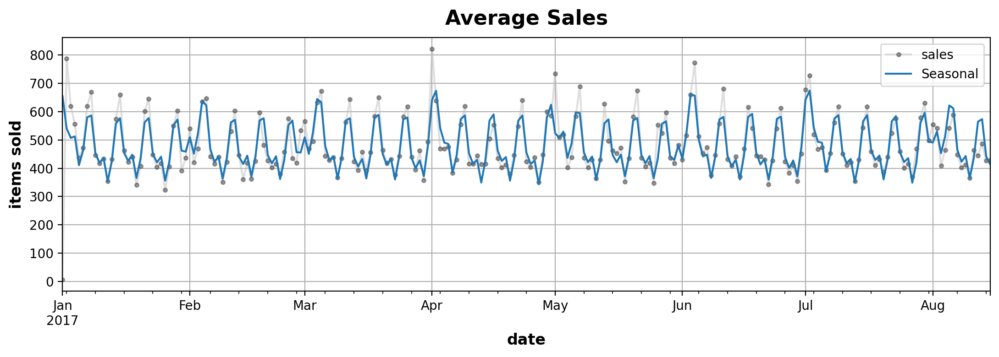

<Figure size 1100x400 with 0 Axes>

In [89]:
model = LinearRegression().fit(X, y)

y_pred = pd.Series(model.predict(X), index=X.index, name='Fitted')
y_pred = pd.Series(model.predict(X), index=X.index)

ax = y.plot(**plot_params,
            alpha=0.50, title="Average Sales", ylabel="items sold")
ax = y_pred.plot(ax=ax,
                 label="Seasonal")
ax.legend()
plt.grid()
plt.show()
plt.clf()
del ax

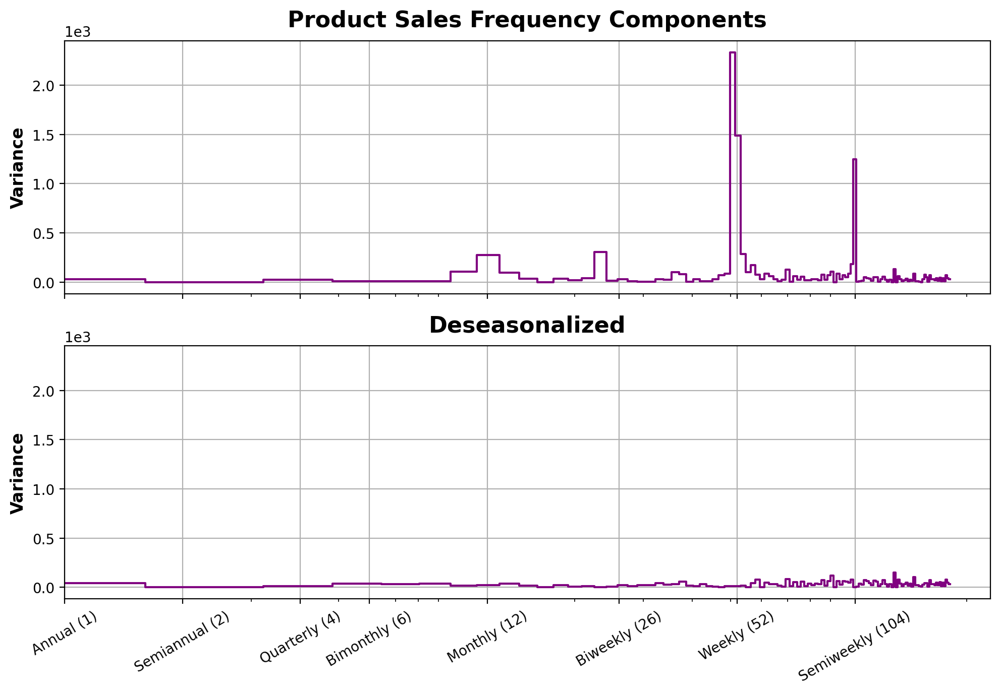

<Figure size 1100x400 with 0 Axes>

In [90]:
y_deseason = y - y_pred

fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, sharey=True, figsize=(10, 7))

ax1 = plot_periodogram(y, ax=ax1)
ax1.set_title("Product Sales Frequency Components")
ax1.grid()

ax2 = plot_periodogram(y_deseason, ax=ax2)
ax2.set_title("Deseasonalized")
ax2.grid()

plt.tight_layout()
plt.show()
plt.clf()

del fig, ax1, ax2

In [91]:
holidays = (holiday_events.query("locale in ['National', 'Regional']").loc['2017':'2017-08-15', ['description']].assign(description=lambda x:x.description.cat.remove_unused_categories()))

display(holidays)

,description
date,
2017-01-01,Primer dia del ano
2017-01-02,Traslado Primer dia del ano
2017-02-27,Carnaval
2017-02-28,Carnaval
2017-04-01,Provincializacion de Cotopaxi
2017-04-14,Viernes Santo
2017-05-01,Dia del Trabajo
2017-05-13,Dia de la Madre-1
2017-05-14,Dia de la Madre


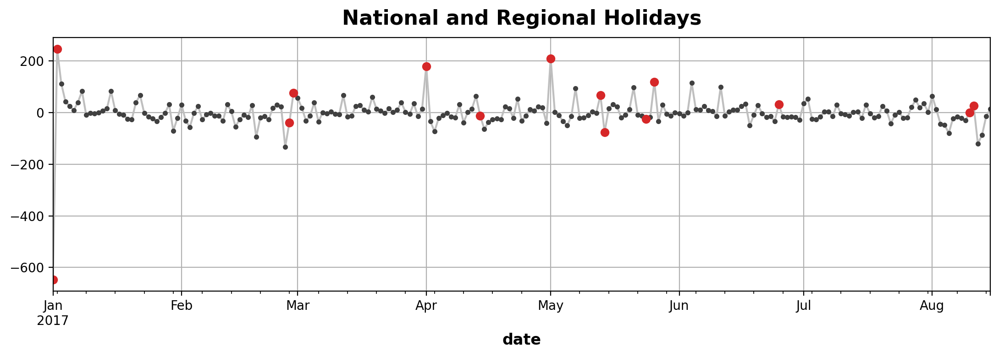

<Figure size 1100x400 with 0 Axes>

In [92]:
ax = y_deseason.plot(**plot_params)

plt.plot_date(holidays.index, 
              y_deseason[holidays.index],
              color='C3')

ax.set_title("National and Regional Holidays")

plt.grid()
plt.show()
plt.clf()
del ax

In [93]:
X_holidays = pd.get_dummies(holidays)

X_holidays

,description_Batalla de Pichincha,description_Carnaval,description_Dia de la Madre,description_Dia de la Madre-1,description_Dia del Trabajo,description_Primer Grito de Independencia,description_Primer dia del ano,description_Provincializacion de Cotopaxi,description_Provincializacion de Imbabura,description_Traslado Batalla de Pichincha,description_Traslado Primer Grito de Independencia,description_Traslado Primer dia del ano,description_Viernes Santo
date,,,,,,,,,,,,,
2017-01-01,False,False,False,False,False,False,True,False,False,False,False,False,False
2017-01-02,False,False,False,False,False,False,False,False,False,False,False,True,False
2017-02-27,False,True,False,False,False,False,False,False,False,False,False,False,False
2017-02-28,False,True,False,False,False,False,False,False,False,False,False,False,False
2017-04-01,False,False,False,False,False,False,False,True,False,False,False,False,False
2017-04-14,False,False,False,False,False,False,False,False,False,False,False,False,True
2017-05-01,False,False,False,False,True,False,False,False,False,False,False,False,False
2017-05-13,False,False,False,True,False,False,False,False,False,False,False,False,False
2017-05-14,False,False,True,False,False,False,False,False,False,False,False,False,False


In [94]:
X2 = X.join(X_holidays, on="date").fillna(0.0)

X2

,const,trend,"s(2,7)","s(3,7)","s(4,7)","s(5,7)","s(6,7)","s(7,7)","sin(1,freq=ME)","cos(1,freq=ME)",...,description_Dia de la Madre-1,description_Dia del Trabajo,description_Primer Grito de Independencia,description_Primer dia del ano,description_Provincializacion de Cotopaxi,description_Provincializacion de Imbabura,description_Traslado Batalla de Pichincha,description_Traslado Primer Grito de Independencia,description_Traslado Primer dia del ano,description_Viernes Santo
date,,,,,,,,,,,,,,,,,,,,,
2017-01-01,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,1.000000,...,False,False,False,True,False,False,False,False,False,False
2017-01-02,1.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.201299,0.979530,...,False,False,False,False,False,False,False,False,True,False
2017-01-03,1.0,3.0,0.0,1.0,0.0,0.0,0.0,0.0,0.394356,0.918958,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2017-01-04,1.0,4.0,0.0,0.0,1.0,0.0,0.0,0.0,0.571268,0.820763,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2017-01-05,1.0,5.0,0.0,0.0,0.0,1.0,0.0,0.0,0.724793,0.688967,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-08-11,1.0,223.0,0.0,0.0,0.0,0.0,1.0,0.0,0.897805,-0.440394,...,False,False,False,False,False,False,False,True,False,False
2017-08-12,1.0,224.0,0.0,0.0,0.0,0.0,0.0,1.0,0.790776,-0.612106,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2017-08-13,1.0,225.0,0.0,0.0,0.0,0.0,0.0,0.0,0.651372,-0.758758,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


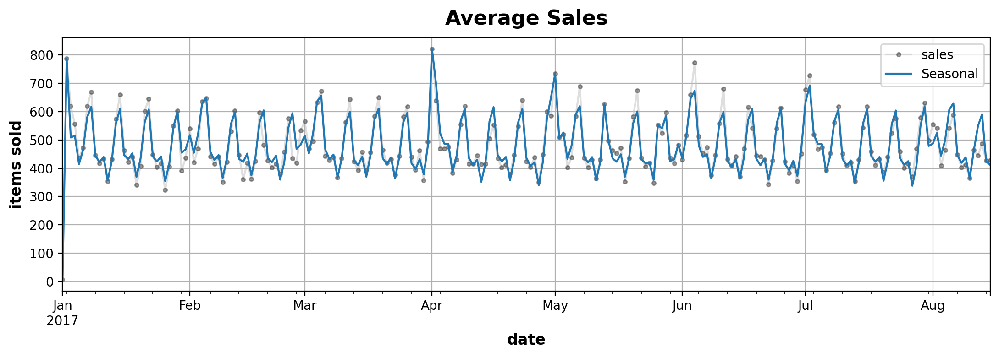

<Figure size 1100x400 with 0 Axes>

In [95]:
model = LinearRegression().fit(X2, y)

y_pred = pd.Series(model.predict(X2),
                   index = X2.index,
                   name = 'Fitted')

y_pred = pd.Series(model.predict(X2), index=X2.index)

ax = y.plot(**plot_params,
            alpha=0.5, title='Average Sales', ylabel="items sold")
ax = y_pred.plot(ax=ax,
                 label="Seasonal")
ax.legend()

plt.grid()
plt.show()
plt.clf()
del ax

In [ ]:
del holidays, X_holidays, X2
del X, y, fourier, dp, model, y_pred, y_deseason
del holiday_events, store_sales, average_sales

---

#### Competition work

In [96]:
y = store_sales.unstack(['store_nbr', 'family']).loc["2017"]

# Create training data
fourier = CalendarFourier(freq='M', order=4)
dp      = DeterministicProcess(index=y.index, constant=True, order=1,
                               seasonal=True, additional_terms=[fourier], drop=True)

X = dp.in_sample()
X['NewYear'] = (X.index.dayofyear == 1)

model = LinearRegression(fit_intercept=False).fit(X, y)

y_pred = pd.DataFrame(model.predict(X), 
                      index   = X.index, 
                      columns = y.columns)

CategoricalIndex(['AUTOMOTIVE', 'BABY CARE', 'BEAUTY', 'BEVERAGES', 'BOOKS',
                  'BREAD/BAKERY', 'CELEBRATION', 'CLEANING', 'DAIRY', 'DELI',
                  'EGGS', 'FROZEN FOODS', 'GROCERY I', 'GROCERY II',
                  'HARDWARE', 'HOME AND KITCHEN I', 'HOME AND KITCHEN II',
                  'HOME APPLIANCES', 'HOME CARE', 'LADIESWEAR',
                  'LAWN AND GARDEN', 'LINGERIE', 'LIQUOR,WINE,BEER',
                  'MAGAZINES', 'MEATS', 'PERSONAL CARE', 'PET SUPPLIES',
                  'PLAYERS AND ELECTRONICS', 'POULTRY', 'PREPARED FOODS',
                  'PRODUCE', 'SCHOOL AND OFFICE SUPPLIES', 'SEAFOOD'],
                 categories=['AUTOMOTIVE', 'BABY CARE', 'BEAUTY', 'BEVERAGES', ..., 'PREPARED FOODS', 'PRODUCE', 'SCHOOL AND OFFICE SUPPLIES', 'SEAFOOD'], ordered=False, dtype='category', name='family')

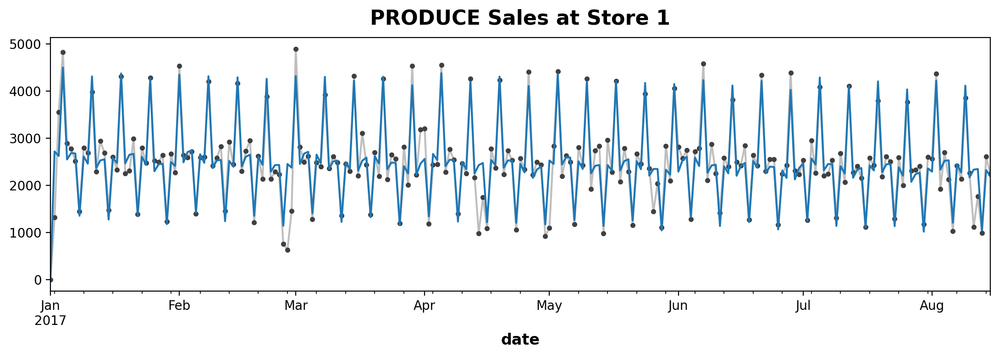

In [97]:
STORE_NBR = '1'  # 1 - 54
FAMILY = 'PRODUCE'
# Uncomment to see a list of product families
display(store_sales.index.get_level_values('family').unique())

ax = y.loc(axis=1)['sales', STORE_NBR, FAMILY].plot(**plot_params)
ax = y_pred.loc(axis=1)['sales', STORE_NBR, FAMILY].plot(ax=ax)
ax.set_title(f'{FAMILY} Sales at Store {STORE_NBR}');

In [98]:
df_test = pd.read_csv(
    local_datapath + '/test.csv',
    dtype={'store_nbr': 'category',
           'family': 'category',
           'onpromotion': 'uint32'},
    parse_dates=['date'],
    infer_datetime_format=True
    )

df_test['date'] = df_test.date.dt.to_period('D')
df_test         = df_test.set_index(['store_nbr', 'family', 'date']).sort_index()

# Create features for test set
X_test = dp.out_of_sample(steps=16)
X_test.index.name = 'date'
X_test['NewYear'] = (X_test.index.dayofyear == 1)


y_submit = pd.DataFrame(model.predict(X_test), index=X_test.index, columns=y.columns)
y_submit = y_submit.stack(['store_nbr', 'family'])
y_submit = y_submit.join(df_test.id).reindex(columns=['id', 'sales'])
#y_submit.to_csv('submission.csv', index=False)


In [ ]:
del y, fourier, dp, X, model, y_pred
del STORE_NBR, FAMILY
del df_test, X_test, y_submit

---

### IV. Time Series as Features

#### Background & Examples

In [99]:
reserve = pd.read_csv(local_datapath + '/reserve.csv',
                      parse_dates = {'Date': ['Year', 'Month', 'Day']},
                      index_col = 'Date')

reserve.head()

,Federal Funds Target Rate,Federal Funds Upper Target,Federal Funds Lower Target,Effective Federal Funds Rate,Real GDP (Percent Change),Unemployment Rate,Inflation Rate
Date,,,,,,,
1954-07-01,NaN,NaN,NaN,0.80,4.6,5.8,NaN
1954-08-01,NaN,NaN,NaN,1.22,NaN,6.0,NaN
1954-09-01,NaN,NaN,NaN,1.06,NaN,6.1,NaN
1954-10-01,NaN,NaN,NaN,0.85,8.0,5.7,NaN
1954-11-01,NaN,NaN,NaN,0.83,NaN,5.3,NaN


In [100]:
y = reserve.loc[:, 'Unemployment Rate'].dropna().to_period('M')

df = pd.DataFrame({
    'y': y,
    'y_lag_1': y.shift(1),
    'y_lag_2': y.shift(2)
})

df.head()

,y,y_lag_1,y_lag_2
Date,,,
1954-07,5.8,NaN,NaN
1954-08,6.0,5.8,NaN
1954-09,6.1,6.0,5.8
1954-10,5.7,6.1,6.0
1954-11,5.3,5.7,6.1


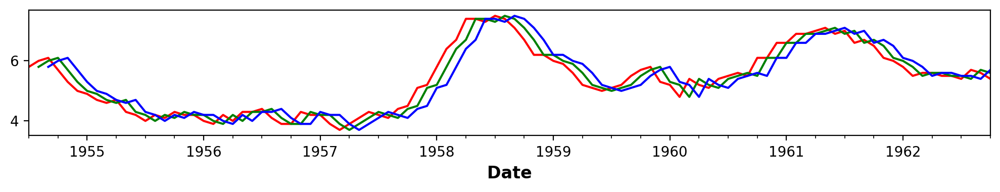

<Figure size 1100x400 with 0 Axes>

In [110]:
fig = plt.figure(figsize=(10,2))

df[0:100].y.plot(color='red')
df[0:100].y_lag_1.plot(color='green')
df[0:100].y_lag_2.plot(color='blue')

plt.show()
plt.clf()

In [111]:
del reserve, df, y

In [41]:
def lag_plot(x, y=None, lag=1, standardize=False, ax=None, **kwargs):
    '''
    Function that generates a lag plot.
    '''
    from matplotlib.offsetbox import AnchoredText
    
    # x data
    x_ = x.shift(lag)
    if standardize:
        x_ = (x_ - x_.mean())/x_.std()
    
    # y data
    if y is not None:
        y_ = (y-y.mean()) / y.std() if standardize else y
    else:
        y_ = x
    
    # correlation data
    corr = y_.corr(x_)

    # axis and text 
    if ax is None:
        fig, ax = plt.subplots()
    scatter_kws = dict(alpha=0.75, s=3)
    line_kws    = dict(color='C3')
    ax = sns.regplot(x = x_, 
                     y = y_,
                     scatter_kws = scatter_kws,
                     line_kws = line_kws,
                     lowess = True, ax = ax , **kwargs)
    at = AnchoredText(f"{corr:.2f}", 
                      prop = dict(size='large'), frameon=True, loc='upper left')
    at.patch.set_boxstyle("square, pad=0.0")
    ax.add_artist(at)
    ax.set(title = f'Lag {lag}',
           xlabel = x_.name,
           ylabel = y_.name)
    ax.grid(True)
    return ax


def plot_lags(x, y=None, lags=6, nrows=1, lagplot_kwargs={}, **kwargs):
    '''
    '''
    import math
    kwargs.setdefault('nrows', nrows)
    kwargs.setdefault('ncols', math.ceil( lags/nrows ))
    kwargs.setdefault('figsize', (kwargs['ncols']*2, nrows*2+0.5))

    fig, axs = plt.subplots(sharex=True, sharey=True, squeeze=False, **kwargs)
    for ax, k in zip(fig.get_axes(), range(kwargs['nrows'] * kwargs['ncols'])):
        if k+1 <= lags:
            ax = lag_plot(x, y, lag=k+1, ax=ax, **lagplot_kwargs)
            ax.set_title(f"Lag {k+1}", fontdict=dict(fontsize=14))
            ax.set(xlabel='', ylabel='')
        else:
            ax.axis('off')
        ax.grid(True)
    plt.setp(axs[-1, :], xlabel=x.name)
    plt.setp(axs[ :, 0], ylabel=y.name if y is not None else x.name)
    fig.tight_layout(w_pad=0.1, h_pad=0.1)
    return fig


def make_lags(ts, lags):
    return pd.concat({f'y_lag_{i}': ts.shift(i) for i in range(1, lags+1)},
                     axis=1)



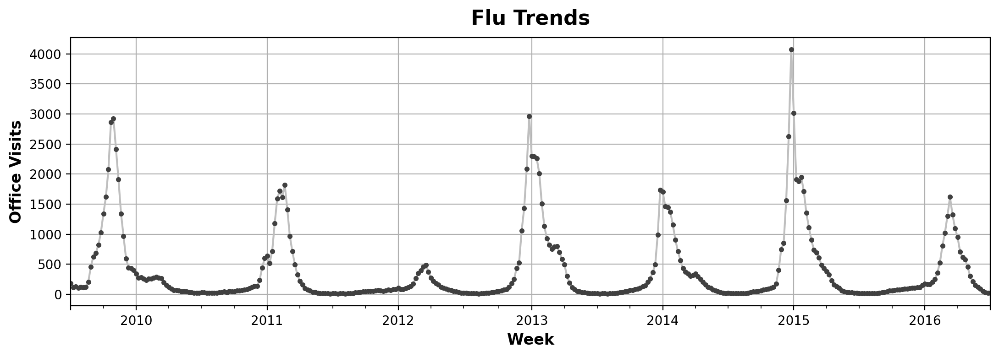

In [138]:
flu_trends = pd.read_csv(local_datapath + '/flu-trends.csv')

flu_trends.set_index(pd.PeriodIndex(flu_trends.Week, freq='W'), inplace=True)
flu_trends.drop("Week", axis=1, inplace=True)

ax = flu_trends['FluVisits'].plot(title="Flu Trends", **plot_params)
_  = ax.set(ylabel = 'Office Visits')
ax.grid()


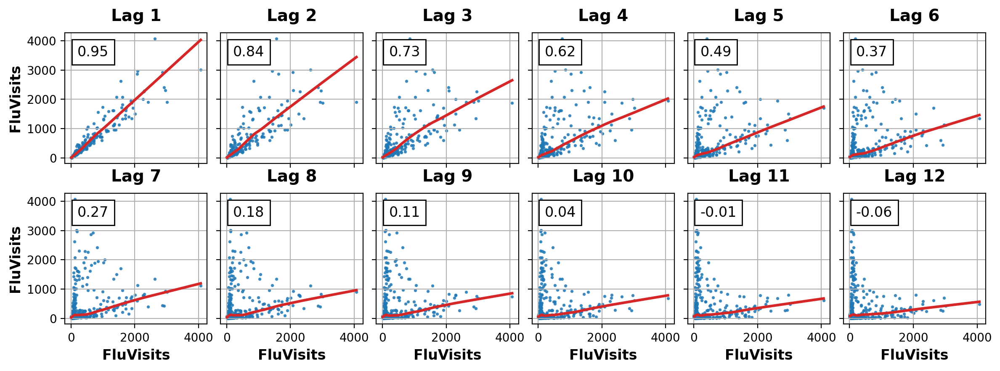

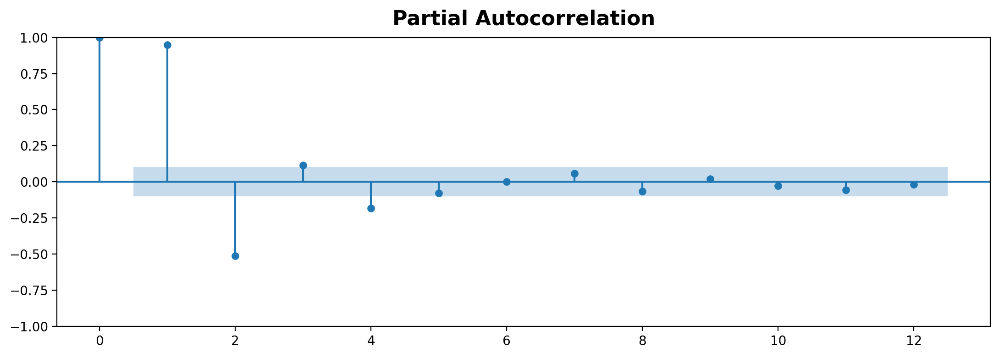

In [143]:
_ = plot_lags(flu_trends['FluVisits'], lags=12, nrows=2)
_ = plot_pacf(flu_trends['FluVisits'], lags=12)


In [146]:
X = make_lags(flu_trends['FluVisits'], lags=4).fillna(0.0)

X.head()

,y_lag_1,y_lag_2,y_lag_3,y_lag_4
Week,,,,
2009-06-29/2009-07-05,0.0,0.0,0.0,0.0
2009-07-06/2009-07-12,180.0,0.0,0.0,0.0
2009-07-13/2009-07-19,115.0,180.0,0.0,0.0
2009-07-20/2009-07-26,132.0,115.0,180.0,0.0
2009-07-27/2009-08-02,109.0,132.0,115.0,180.0


In [147]:
y = flu_trends.FluVisits.copy()

X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size=60,
                                                    shuffle=False)

model = LinearRegression().fit(X_train, y_train)

y_pred = pd.Series(model.predict(X_train), index = y_train.index)
y_fore = pd.Series(model.predict(X_test),  index = y_test.index)


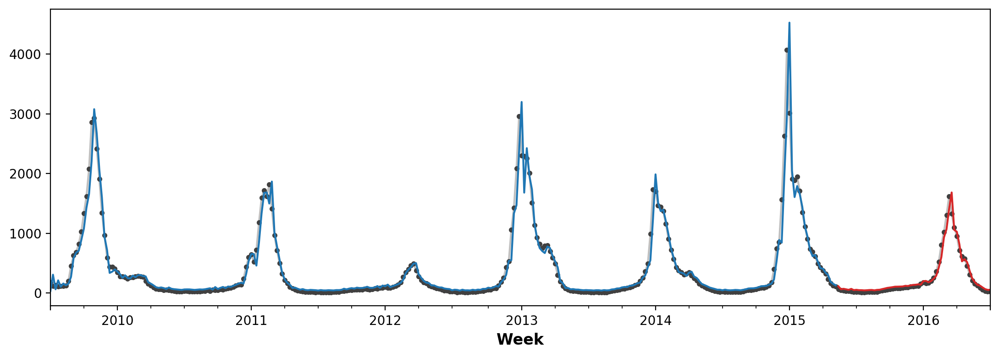

In [151]:
ax = y_train.plot(**plot_params)
ax = y_test.plot(**plot_params)
ax = y_pred.plot(ax=ax)
_  = y_fore.plot(ax=ax, color='C3')


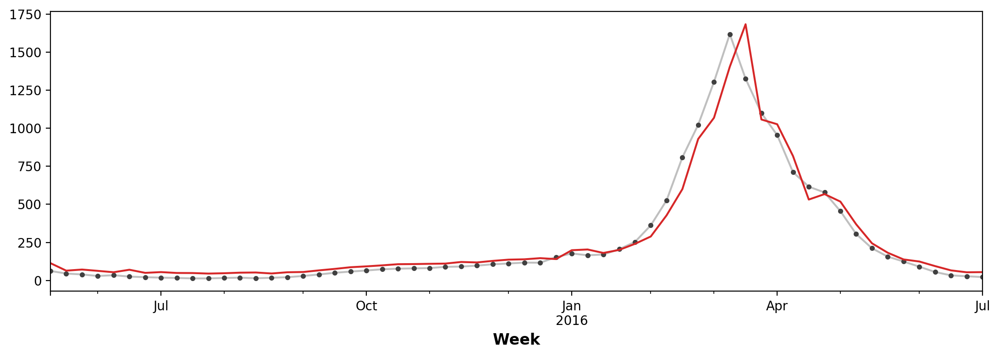

In [152]:
ax = y_test.plot(**plot_params)
_  = y_fore.plot(ax=ax, color='C3')


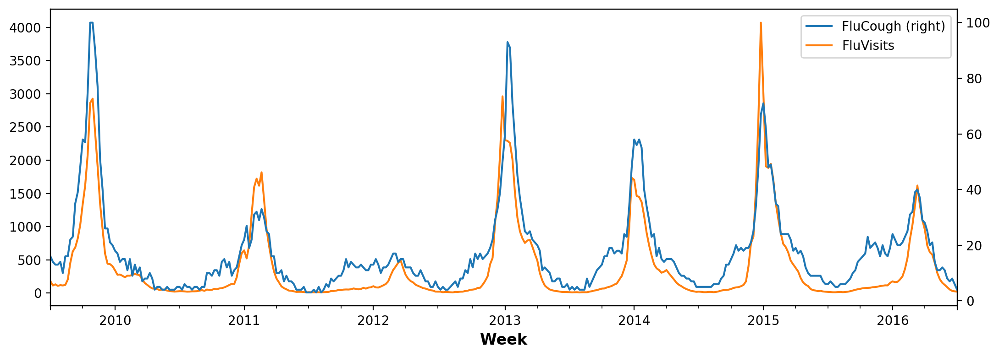

In [153]:
ax = flu_trends.plot(y=['FluCough', 'FluVisits'], secondary_y='FluCough')


In [155]:
search_terms = ["FluContagious", "FluCough", "FluFever", "InfluenzaA", "TreatFlu", "IHaveTheFlu", "OverTheCounterFlu", "HowLongFlu"]

X0         = make_lags(flu_trends[search_terms], lags = 3)
X0.columns = [' '.join(col).strip() for col in X0.columns.values]

X1 = make_lags(flu_trends['FluVisits'], lags=4)

X = pd.concat([X0, X1], axis=1).fillna(0.0)

del X0, X1

X.head()

,y_lag_1 FluContagious,y_lag_1 FluCough,y_lag_1 FluFever,y_lag_1 InfluenzaA,y_lag_1 TreatFlu,y_lag_1 IHaveTheFlu,y_lag_1 OverTheCounterFlu,y_lag_1 HowLongFlu,y_lag_2 FluContagious,y_lag_2 FluCough,...,y_lag_3 FluFever,y_lag_3 InfluenzaA,y_lag_3 TreatFlu,y_lag_3 IHaveTheFlu,y_lag_3 OverTheCounterFlu,y_lag_3 HowLongFlu,y_lag_1,y_lag_2,y_lag_3,y_lag_4
Week,,,,,,,,,,,,,,,,,,,,,
2009-06-29/2009-07-05,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2009-07-06/2009-07-12,5.0,16.0,15.0,36.0,6.0,5.0,11.0,6.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,180.0,0.0,0.0,0.0
2009-07-13/2009-07-19,6.0,14.0,15.0,25.0,12.0,7.0,7.0,7.0,5.0,16.0,...,0.0,0.0,0.0,0.0,0.0,0.0,115.0,180.0,0.0,0.0
2009-07-20/2009-07-26,6.0,13.0,13.0,24.0,8.0,8.0,7.0,7.0,6.0,14.0,...,15.0,36.0,6.0,5.0,11.0,6.0,132.0,115.0,180.0,0.0
2009-07-27/2009-08-02,5.0,13.0,12.0,23.0,5.0,4.0,6.0,6.0,6.0,13.0,...,15.0,25.0,12.0,7.0,7.0,7.0,109.0,132.0,115.0,180.0


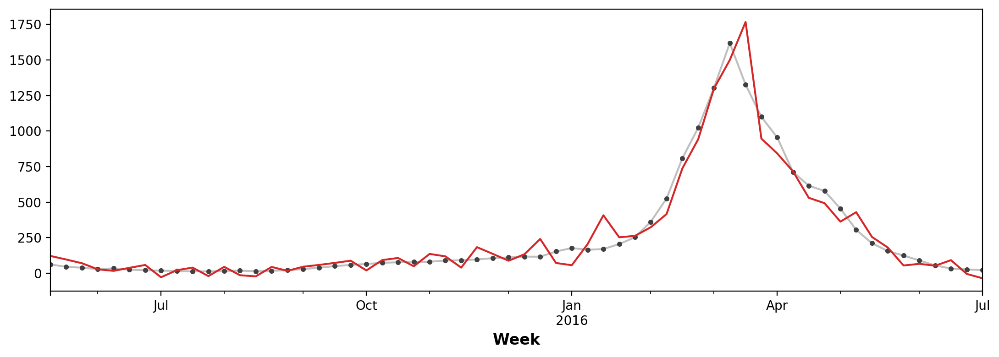

In [156]:
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size=60,
                                                    shuffle=False)

model = LinearRegression().fit(X_train, y_train)

y_pred = pd.Series(model.predict(X_train),
                   index = y_train.index)
y_fore = pd.Series(model.predict(X_test),
                   index = y_test.index)

ax = y_test.plot(**plot_params)
_  = y_fore.plot(ax=ax, color='C3')


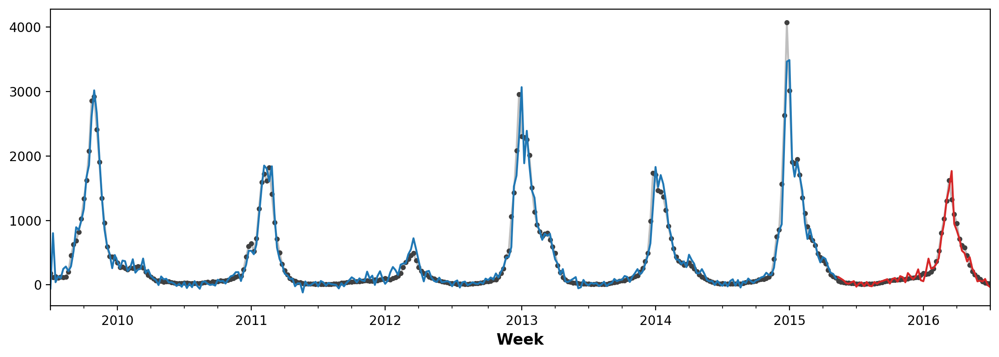

In [157]:
ax = y_train.plot(**plot_params)
ax = y_test.plot(**plot_params)
ax = y_pred.plot(ax=ax)
_  = y_fore.plot(ax=ax, color='C3')


In [159]:
del fig, ax

In [158]:
del model, X, X_test, X_train, y, y_train, y_test, y_pred, y_fore
del search_terms, flu_trends
 

#### Exercises

In [161]:
store_sales = pd.read_csv(local_datapath +'/train.csv', 
                          usecols = ['store_nbr','family','date','sales','onpromotion'],
                          dtype={'store_nbr': 'category',
                                 'family': 'category',
                                 'sales': 'float32',
                                 'onpromotion': 'uint32'}, 
                        parse_dates=['date'],
                        infer_datetime_format=True)
store_sales.date = store_sales.date.dt.to_period('D')
store_sales      = store_sales.set_index(['store_nbr','family','date']).sort_index()

family_sales = (store_sales.groupby(['family', 'date']).mean().unstack('family').loc['2017', ['sales','onpromotion']])


In [162]:
family_sales.head()

sales                                              \
family     AUTOMOTIVE BABY CARE     BEAUTY    BEVERAGES     BOOKS   
date                                                                
2017-01-01   0.092593  0.037037   0.055556    74.222221  0.000000   
2017-01-02  11.481482  0.259259  11.648149  6208.055664  0.481481   
2017-01-03   8.296296  0.296296   7.185185  4507.814941  0.814815   
2017-01-04   6.833333  0.333333   6.888889  3911.833252  0.759259   
2017-01-05   6.333333  0.351852   5.925926  3258.796387  0.407407   

                                                                           \
family     BREAD/BAKERY CELEBRATION     CLEANING        DAIRY        DELI   
date                                                                        
2017-01-01     9.084685    0.129630     7.500000    11.518518    3.629167   
2017-01-02   844.836304   14.203704  2233.648193  1545.000000  539.114807   
2017-01-03   665.124146   10.629630  1711.907349  1204.203735  404.300049   
2017-01-04   594.160645   11.185185  1508.036987  1107.796265  309.397675   
2017-01-05   495.511597   12.444445  1241.833374   829.277771  260.776489   

            ... onpromotion                                       \
family      ...   MAGAZINES     MEATS PERSONAL CARE PET SUPPLIES   
date        ...                                                    
2017-01-01  ...         0.0  0.018519      0.111111     0.018519   
2017-01-02  ...         0.0  0.462963     10.592593     0.537037   
2017-01-03  ...         0.0  0.481481      9.722222     0.444444   
2017-01-04  ...         0.0  0.370370     12.037037     0.444444   
2017-01-05  ...         0.0  8.981481      5.666667     0.000000   

                                                                         \
family     PLAYERS AND ELECTRONICS   POULTRY PREPARED FOODS     PRODUCE   
date                                                                      
2017-01-01                     0.0  0.000000       0.037037    0.129630   
2017-01-02                     0.0  0.259259       1.166667    5.629630   
2017-01-03                     0.0  0.388889       1.351852   56.296296   
2017-01-04                     0.0  0.296296       5.444444  101.277778   
2017-01-05                     0.0  0.296296       0.907407    5.018519   

                                                 
family     SCHOOL AND OFFICE SUPPLIES   SEAFOOD  
date                                             
2017-01-01                        0.0  0.000000  
2017-01-02                        0.0  0.407407  
2017-01-03                        0.0  0.407407  
2017-01-04                        0.0  0.333333  
2017-01-05                        0.0  0.444444  

[5 rows x 66 columns]

In [164]:
supply_sales = family_sales.loc(axis=1)[:, 'SCHOOL AND OFFICE SUPPLIES']
y            = supply_sales.loc[:, 'sales'].squeeze()

fourier = CalendarFourier(freq = 'M',
                          order = 4)
dp      = DeterministicProcess(constant = True, 
                               index = y.index, 
                               order = 1, 
                               seasonal = True, 
                               drop = True,
                               additional_terms = [fourier])

X_time                = dp.in_sample()
X_time['NewYearsDay'] = (X_time.index.dayofyear == 1)

model = LinearRegression(fit_intercept=False).fit(X_time, y)

y_deseason      = y - model.predict(X_time)
y_deseason.name = 'sales_deseasoned'


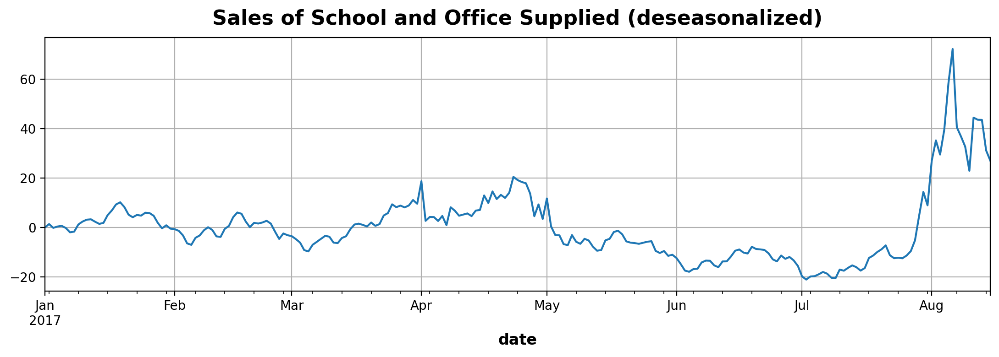

In [173]:
ax = y_deseason.plot()
ax.set_title("Sales of School and Office Supplied (deseasonalized)")
ax.grid()

del ax

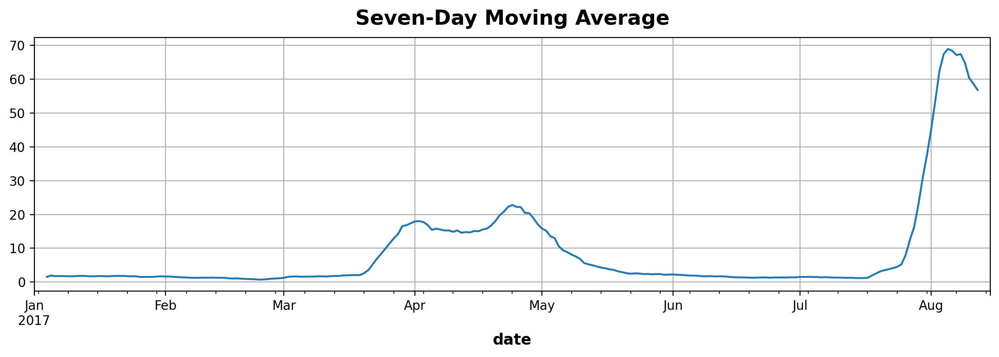

In [174]:
y_ma = y.rolling(window=7, center=True).mean()

ax = y_ma.plot()
ax.set_title("Seven-Day Moving Average")
ax.grid()

del ax

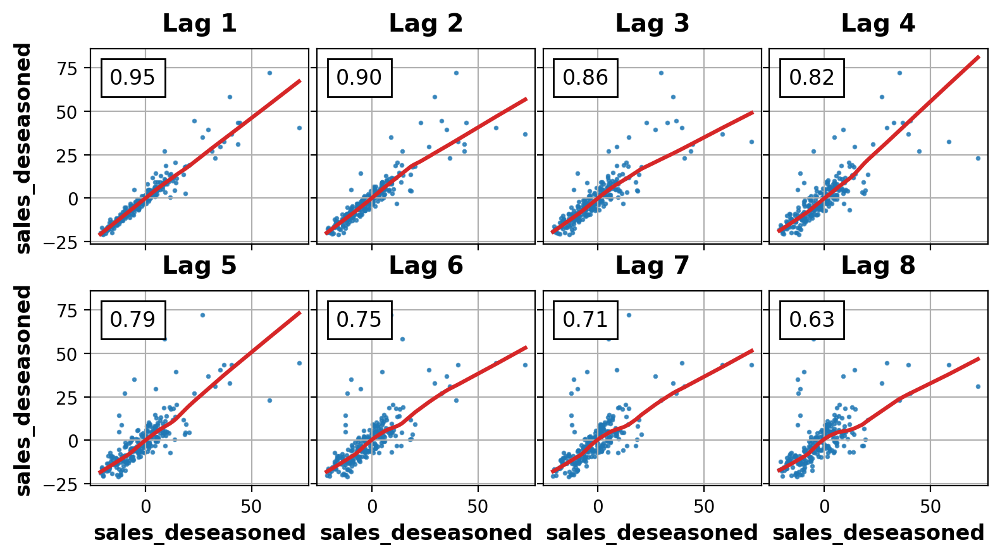

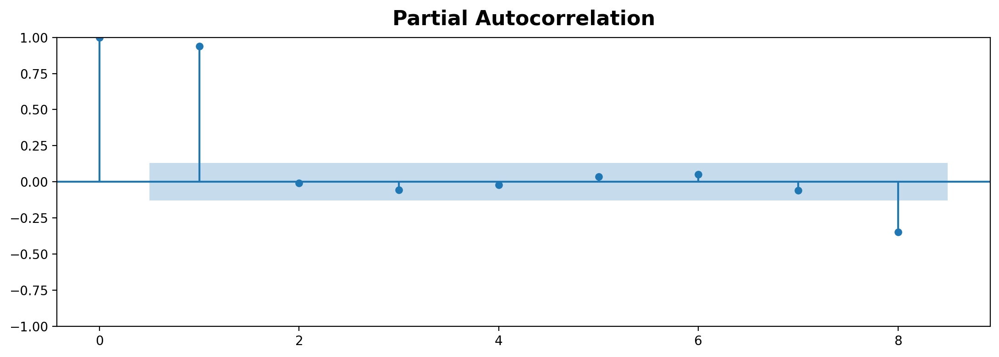

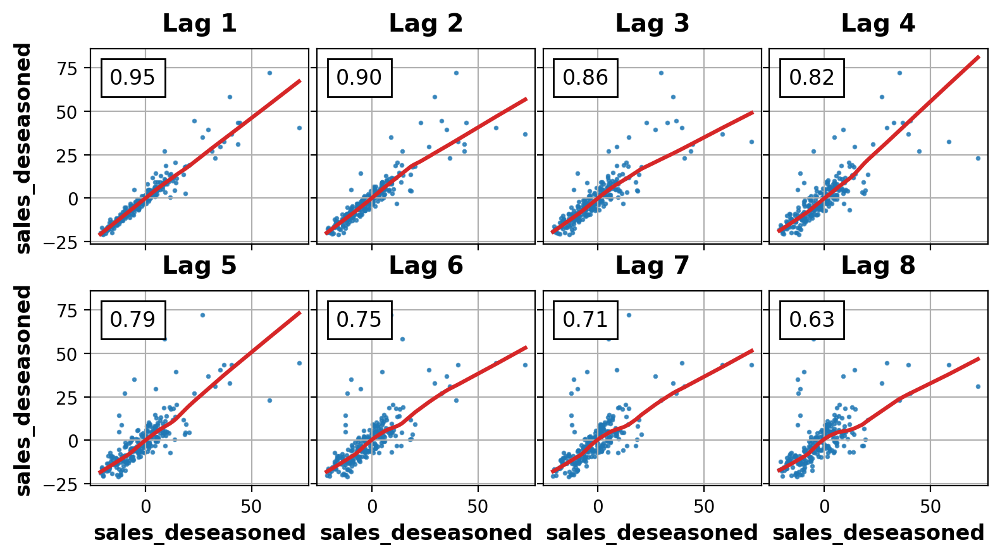

In [178]:
plot_pacf(y_deseason, lags=8)

plot_lags(y_deseason, lags=8, nrows=2)

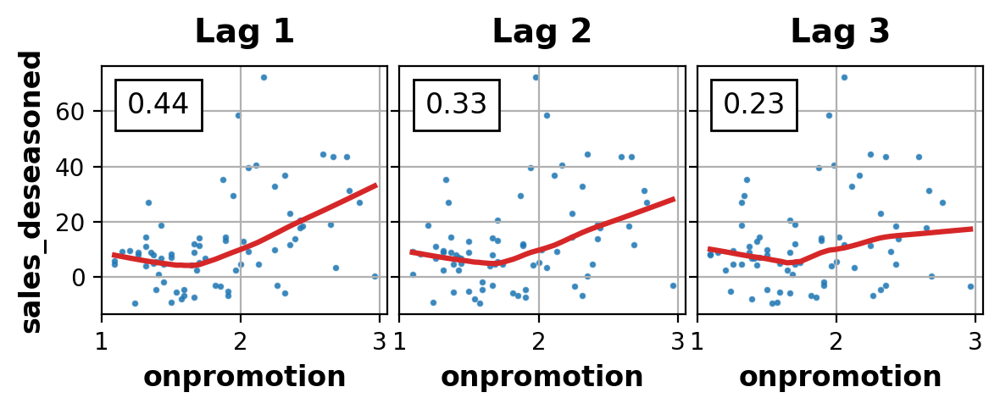

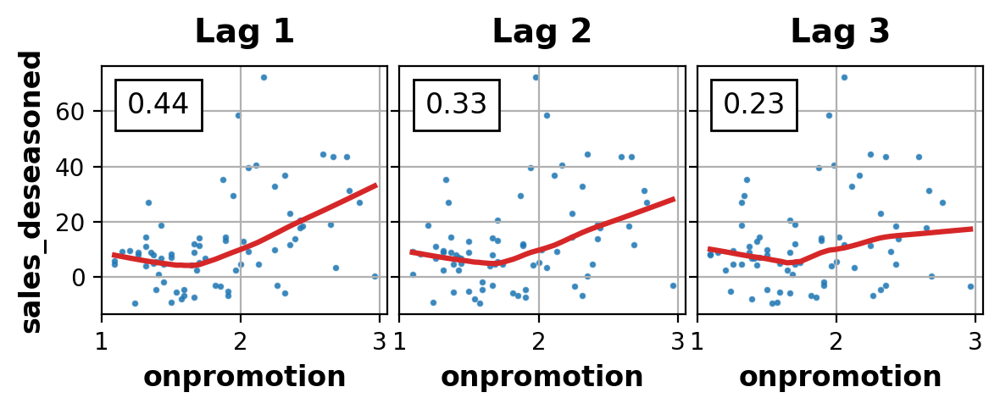

In [180]:
onpromotion = supply_sales.loc[:, 'onpromotion'].squeeze().rename("onpromotion")

plot_lags(x = onpromotion.loc[onpromotion > 1],
          y = y_deseason.loc[onpromotion > 1],
          lags = 3, 
          #leads = 3, 
          nrows = 1)


In [189]:
X_lags  = make_lags(y_deseason, lags=1)
X_promo = make_lags(onpromotion, lags=3)

X = pd.concat([X_lags, X_promo], axis=1)

X.head()

,y_lag_1,y_lag_1,y_lag_2,y_lag_3
date,,,,
2017-01-01,NaN,NaN,NaN,NaN
2017-01-02,2.087219e-14,0.0,NaN,NaN
2017-01-03,1.362820e+00,0.0,0.0,NaN
2017-01-04,-1.724815e-01,0.0,0.0,0.0
2017-01-05,3.777271e-01,0.0,0.0,0.0


In [200]:
y_lag   = supply_sales.loc[:, 'sales'].shift(1)
onpromo = supply_sales.loc[:, 'onpromotion']

# 28-day mean of lagged target
mean_7 = y_lag.rolling(28).mean().fillna(0.0)

# YOUR CODE HERE: 14-day median of lagged target
median_14 = y_lag.rolling(14).median().fillna(0.0)

# YOUR CODE HERE: 7-day rolling standard deviation of lagged target
std_7 = y_lag.rolling(7).std().fillna(0.0)

# YOUR CODE HERE: 7-day sum of promotions with centered window
promo_7 = onpromo.rolling(7, center=True).sum().fillna(0.0)

In [201]:
promo_7

family,SCHOOL AND OFFICE SUPPLIES
date,
2017-01-01,0.000000
2017-01-02,0.000000
2017-01-03,0.000000
2017-01-04,0.000000
2017-01-05,0.000000
...,...
2017-08-11,18.240741
2017-08-12,18.740741
2017-08-13,0.000000


In [ ]:
del y_lag, onpromo, mean_7, median_14, std_7, promo_7
del X, X_lags, X_promo
del y, fourier, dp, X_time, model, y_deseason, y_ma
del onpromotion, supply_sales, store_sales, family_sales


---

### V. Hybrid Models

#### Background & Examples



The four components to time series work:

`time series = trend + seasons + cycles + error`

Really interesting note on component learning: *"We could imagine learning the components of a time series as an iterative process: first learn the trend and subtract it out from the series, then learn the seasonality from the detrended residuals and subtract the seasons out, then learn the cycles and subtract the cycles out, and finally only the unpredictable error remains."*

Generate one algorithm from two:
- model based on the *original* series
- model based on the *residual* series
    - *but* this second model is dependent on the first
    - use different feature sets for these two models



In [8]:
industries = ['BuildingMaterials', 'FoodAndBeverage']

retail = pd.read_csv(local_datapath + '/us-retail-sales.csv',
                     usecols = ['Month']+industries,
                     parse_dates = ['Month'],
                     index_col='Month').to_period('D').reindex(columns=industries)

retail = pd.concat({'Sales':retail}, names=[None, 'Industries'], axis=1)

retail.head()

Sales                
Industries BuildingMaterials FoodAndBeverage
Month                                       
1992-01-01              8964           29589
1992-02-01              9023           28570
1992-03-01             10608           29682
1992-04-01             11630           30228
1992-05-01             12327           31677

In [9]:
y = retail.copy()

dp = DeterministicProcess(index = y.index,  # Dates from training data
                          constant = True,  # the intercept
                          order = 2,        # quadratic-based trend
                          drop = True       # drop terms to avoid collinearity
                          )

# Features for the training set:
X = dp.in_sample()

idx_train, idx_test = train_test_split(y.index, 
                                       test_size = 12*4,
                                       shuffle = False)

X_train, X_test = X.loc[idx_train, :], X.loc[idx_test, :]
y_train, y_test = y.loc[idx_train],    y.loc[idx_test]

model = LinearRegression(fit_intercept=False).fit(X_train, y_train)

y_fit = pd.DataFrame(model.predict(X_train),
                     index = y_train.index,
                     columns = y_train.columns)

y_pred = pd.DataFrame(model.predict(X_test), 
                      index = y_test.index, 
                      columns = y_test.columns)



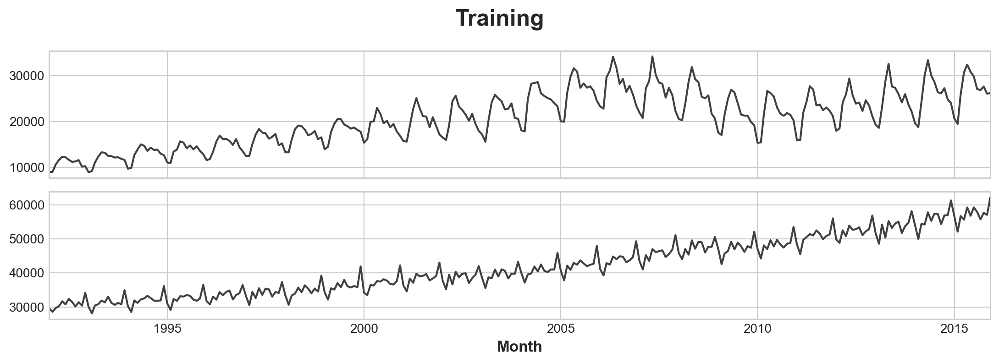

In [10]:
axs = y_train.plot(color='0.25', subplots=True, sharex=True)
#axs = y_test.plot(color='0.25', subplots=True, sharex=True, ax=axs)
#axs = y_fit.plot(color='C0', subplots=True, sharex=True, ax=axs)
#axs = y_pred.plot(color='C3', subplots=True, sharex=True, ax=axs)

for ax in axs:
    ax.legend([])

_ = plt.suptitle("Training")

del axs

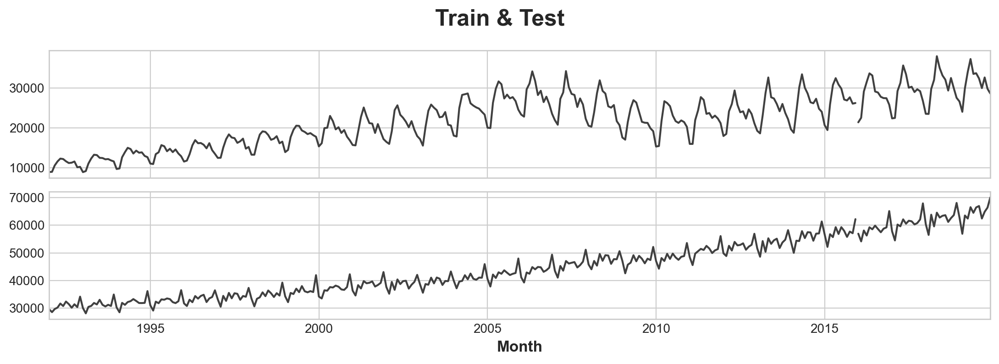

In [11]:
axs = y_train.plot(color='0.25', subplots=True, sharex=True)
axs = y_test.plot(color='0.25', subplots=True, sharex=True, ax=axs)
#axs = y_fit.plot(color='C0', subplots=True, sharex=True, ax=axs)
#axs = y_pred.plot(color='C3', subplots=True, sharex=True, ax=axs)

for ax in axs:
    ax.legend([])

_ = plt.suptitle("Train & Test")

del axs

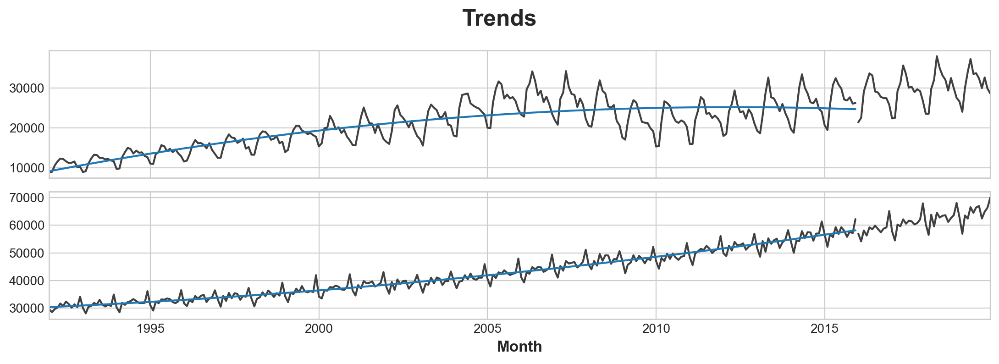

In [12]:
axs = y_train.plot(color='0.25', subplots=True, sharex=True)
axs = y_test.plot(color='0.25', subplots=True, sharex=True, ax=axs)
axs = y_fit.plot(color='C0', subplots=True, sharex=True, ax=axs)
#axs = y_pred.plot(color='C3', subplots=True, sharex=True, ax=axs)

for ax in axs:
    ax.legend([])

_ = plt.suptitle("Trends")

del axs

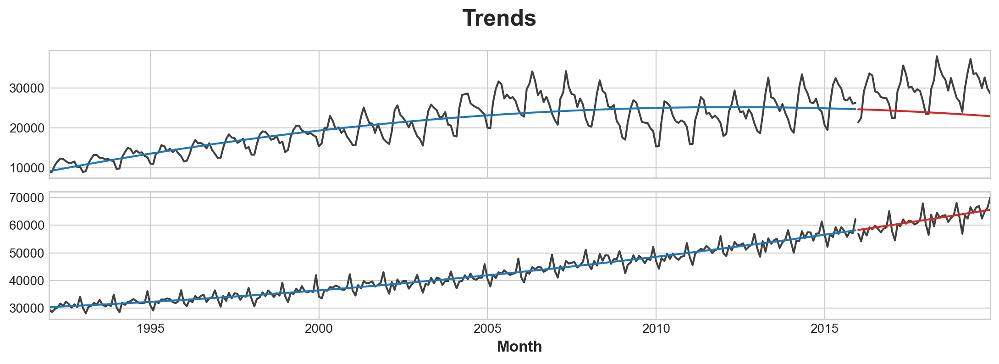

In [13]:
axs = y_train.plot(color='0.25', subplots=True, sharex=True)
axs = y_test.plot(color='0.25', subplots=True, sharex=True, ax=axs)
axs = y_fit.plot(color='C0', subplots=True, sharex=True, ax=axs)
axs = y_pred.plot(color='C3', subplots=True, sharex=True, ax=axs)

for ax in axs:
    ax.legend([])

_ = plt.suptitle("Trends")

del axs

In [14]:
display(retail.head())

X = retail.stack()
display(X.head())

y = X.pop('Sales')


Sales                
Industries BuildingMaterials FoodAndBeverage
Month                                       
1992-01-01              8964           29589
1992-02-01              9023           28570
1992-03-01             10608           29682
1992-04-01             11630           30228
1992-05-01             12327           31677

Sales
Month      Industries              
1992-01-01 BuildingMaterials   8964
           FoodAndBeverage    29589
1992-02-01 BuildingMaterials   9023
           FoodAndBeverage    28570
1992-03-01 BuildingMaterials  10608

In [15]:
X = X.reset_index('Industries')

for colname in X.select_dtypes(['object', 'category']):
    X[colname], _ = X[colname].factorize()

X['Month'] = X.index.month

X_train, X_test = X.loc[idx_train, :], X.loc[idx_test, :]
y_train, y_test = y.loc[idx_train],    y.loc[idx_test]



In [16]:
y_fit  = y_fit.stack().squeeze()
y_fit

Month       Industries       
1992-01-01  BuildingMaterials     9192.966040
            FoodAndBeverage      30384.413252
1992-02-01  BuildingMaterials     9324.354900
            FoodAndBeverage      30430.803516
1992-03-01  BuildingMaterials     9455.202650
                                     ...     
2015-10-01  FoodAndBeverage      57842.118285
2015-11-01  BuildingMaterials    24717.228979
            FoodAndBeverage      57988.765449
2015-12-01  BuildingMaterials    24693.860288
            FoodAndBeverage      58135.764391
Name: Sales, Length: 576, dtype: float64

In [17]:
y_pred = y_pred.stack().squeeze()
y_pred

Month       Industries       
2016-01-01  BuildingMaterials    24669.950487
            FoodAndBeverage      58283.115113
2016-02-01  BuildingMaterials    24645.499575
            FoodAndBeverage      58430.817613
2016-03-01  BuildingMaterials    24620.507554
                                     ...     
2019-10-01  FoodAndBeverage      65277.988422
2019-11-01  BuildingMaterials    22985.159382
            FoodAndBeverage      65441.520959
2019-12-01  BuildingMaterials    22935.817396
            FoodAndBeverage      65605.405275
Name: Sales, Length: 96, dtype: float64

In [18]:
y_resid = y_train - y_fit
y_resid

Month       Industries       
1992-01-01  BuildingMaterials    -228.966040
            FoodAndBeverage      -795.413252
1992-02-01  BuildingMaterials    -301.354900
            FoodAndBeverage     -1860.803516
1992-03-01  BuildingMaterials    1152.797350
                                    ...     
2015-10-01  FoodAndBeverage      -150.118285
2015-11-01  BuildingMaterials    1357.771021
            FoodAndBeverage      -889.765449
2015-12-01  BuildingMaterials    1538.139712
            FoodAndBeverage      4049.235609
Name: Sales, Length: 576, dtype: float64

In [19]:
xgb = XGBRegressor().fit(X_train, y_resid)

y_fit_boosted  = xgb.predict(X_train) + y_fit
y_pred_boosted = xgb.predict(X_test)  + y_pred


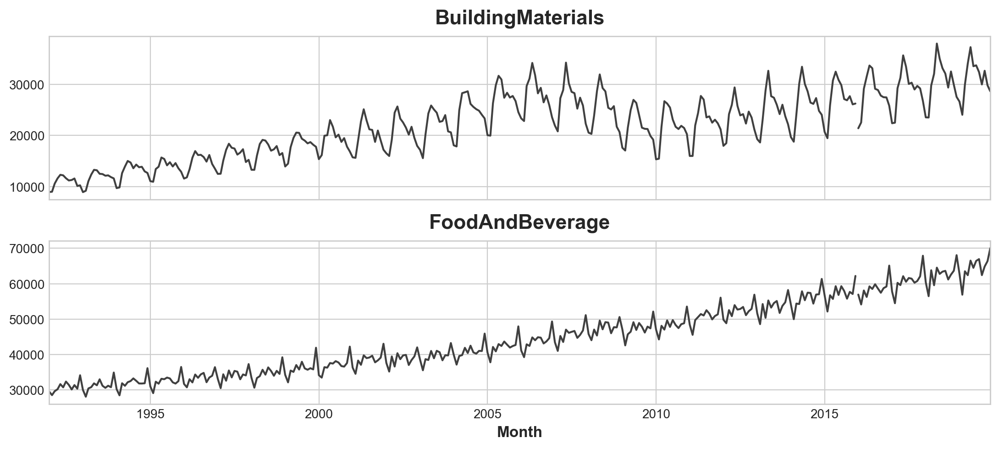

In [20]:
axs = y_train.unstack(['Industries']).plot(color = '0.25', figsize = (11,5), subplots = True, sharex = True,
                                           title = ['BuildingMaterials','FoodAndBeverage'])
axs = y_test.unstack(['Industries']).plot(color = '0.25', subplots = True, sharex = True, ax=axs)

#axs = y_fit_boosted.unstack(['Industries']).plot(color = 'C0', subplots = True, sharex = True, ax=axs)
#axs = y_pred_boosted.unstack(['Industries']).plot(color = 'C3', subplots = True, sharex = True, ax=axs)

for ax in axs: ax.legend([])

del axs

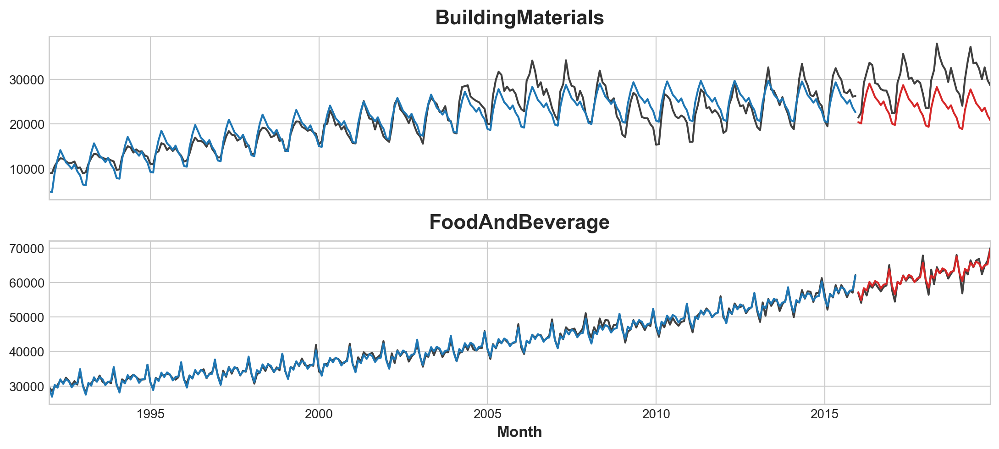

In [21]:
axs = y_train.unstack(['Industries']).plot(color = '0.25', figsize = (11,5), subplots = True, sharex = True,
                                           title = ['BuildingMaterials','FoodAndBeverage'])
axs = y_test.unstack(['Industries']).plot(color = '0.25', subplots = True, sharex = True, ax=axs)

axs = y_fit_boosted.unstack(['Industries']).plot(color = 'C0', subplots = True, sharex = True, ax=axs)
axs = y_pred_boosted.unstack(['Industries']).plot(color = 'C3', subplots = True, sharex = True, ax=axs)

for ax in axs: ax.legend([])

del axs

In [22]:
del dp, model, xgb
del X, y
del X_train, X_test, y_train, y_test, idx_train, idx_test
del y_fit, y_fit_boosted, y_pred, y_pred_boosted, y_resid
del industries, retail
 

#### Exercises

In [23]:
store_sales = pd.read_csv(local_datapath +'/train.csv', 
                          usecols = ['store_nbr','family','date','sales','onpromotion'],
                          dtype={'store_nbr': 'category',
                                 'family': 'category',
                                 'sales': 'float32',
                                 'onpromotion': 'uint32'}, 
                        parse_dates=['date'],
                        infer_datetime_format=True)
store_sales.date = store_sales.date.dt.to_period('D')
store_sales      = store_sales.set_index(['store_nbr','family','date']).sort_index()

family_sales = (store_sales.groupby(['family', 'date']).mean().unstack('family').loc['2017'])


In [24]:
family_sales.head()


sales                                              \
family     AUTOMOTIVE BABY CARE     BEAUTY    BEVERAGES     BOOKS   
date                                                                
2017-01-01   0.092593  0.037037   0.055556    74.222221  0.000000   
2017-01-02  11.481482  0.259259  11.648149  6208.055664  0.481481   
2017-01-03   8.296296  0.296296   7.185185  4507.814941  0.814815   
2017-01-04   6.833333  0.333333   6.888889  3911.833252  0.759259   
2017-01-05   6.333333  0.351852   5.925926  3258.796387  0.407407   

                                                                           \
family     BREAD/BAKERY CELEBRATION     CLEANING        DAIRY        DELI   
date                                                                        
2017-01-01     9.084685    0.129630     7.500000    11.518518    3.629167   
2017-01-02   844.836304   14.203704  2233.648193  1545.000000  539.114807   
2017-01-03   665.124146   10.629630  1711.907349  1204.203735  404.300049   
2017-01-04   594.160645   11.185185  1508.036987  1107.796265  309.397675   
2017-01-05   495.511597   12.444445  1241.833374   829.277771  260.776489   

            ... onpromotion                                       \
family      ...   MAGAZINES     MEATS PERSONAL CARE PET SUPPLIES   
date        ...                                                    
2017-01-01  ...         0.0  0.018519      0.111111     0.018519   
2017-01-02  ...         0.0  0.462963     10.592593     0.537037   
2017-01-03  ...         0.0  0.481481      9.722222     0.444444   
2017-01-04  ...         0.0  0.370370     12.037037     0.444444   
2017-01-05  ...         0.0  8.981481      5.666667     0.000000   

                                                                         \
family     PLAYERS AND ELECTRONICS   POULTRY PREPARED FOODS     PRODUCE   
date                                                                      
2017-01-01                     0.0  0.000000       0.037037    0.129630   
2017-01-02                     0.0  0.259259       1.166667    5.629630   
2017-01-03                     0.0  0.388889       1.351852   56.296296   
2017-01-04                     0.0  0.296296       5.444444  101.277778   
2017-01-05                     0.0  0.296296       0.907407    5.018519   

                                                 
family     SCHOOL AND OFFICE SUPPLIES   SEAFOOD  
date                                             
2017-01-01                        0.0  0.000000  
2017-01-02                        0.0  0.407407  
2017-01-03                        0.0  0.407407  
2017-01-04                        0.0  0.333333  
2017-01-05                        0.0  0.444444  

[5 rows x 66 columns]

In [37]:
class BoostedHybrid:

    def __init__(self, model_1, model_2):
        self.model_1 = model_1
        self.model_2 = model_2
        self.y_columns = None
        

In [38]:
def fit(self, X_1, X_2, y):
    self.model_1.fit(X_1, y)
    y_fit = pd.DataFrame(self.model_1.predict(X_1),
                         index = X_1.index, 
                         columns = y.columns)
    y_resid = y - y_fit
    y_resid = y_resid.stack().squeeze()
    self.model_2.fit(X_2, y_resid)
    self.y_columns = y.columns
    self.y_fit = y_fit
    self.y_resid = y_resid


BoostedHybrid.fit = fit


In [39]:
def predict(self, X_1, X_2):
    y_pred = pd.DataFrame(self.model_1.predict(X_1),
                          index = X_1.index, columns = self.y_columns)
    y_pred = y_pred.stack().squeeze()
    y_pred += self.model_2.predict(X_2)
    return y_pred.unstack()


BoostedHybrid.predict = predict


In [28]:
y = family_sales.loc[:, 'sales']

dp  = DeterministicProcess(index = y.index, order = 1)
X_1 = dp.in_sample()

le            = LabelEncoder()
X_2           = family_sales.drop('sales', axis=1).stack()
X_2           = X_2.reset_index('family')
X_2['family'] = le.fit_transform(X_2['family'])
X_2['day']    = X_2.index.day


In [29]:
model = BoostedHybrid(LinearRegression(), XGBRegressor())

model.fit(X_1, X_2, y)

y_pred = model.predict(X_1, X_2)
y_pred = y_pred.clip(0.0)

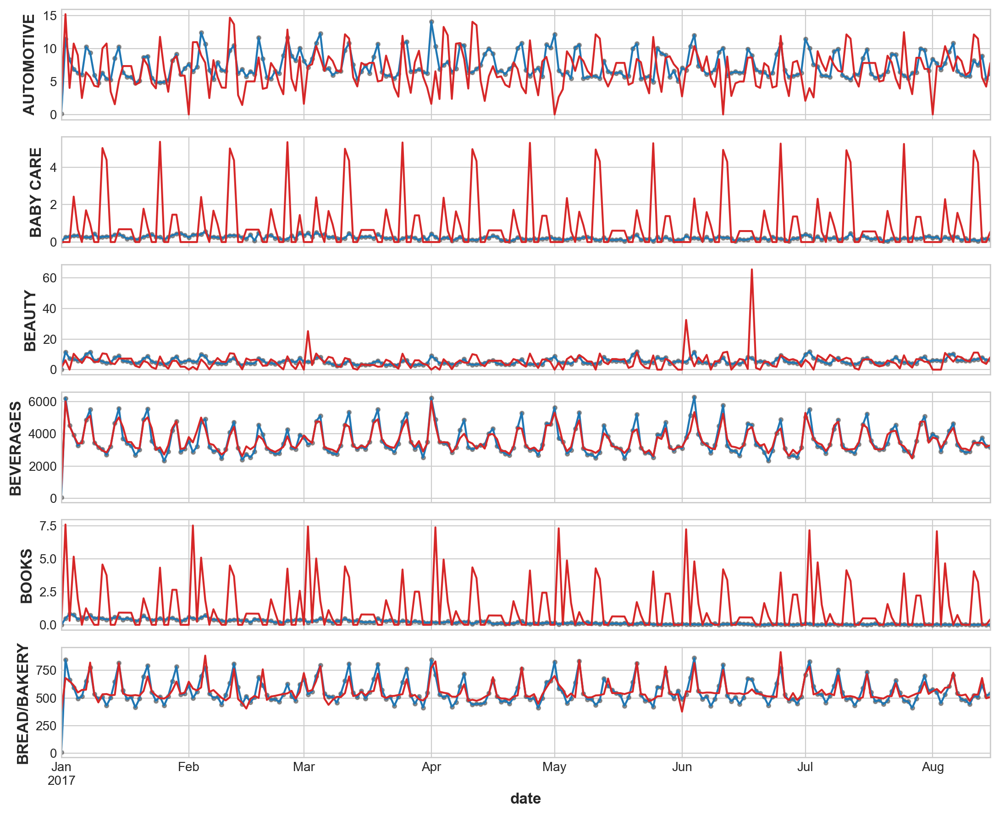

In [30]:
families = y.columns[0:6]

axs = y.loc(axis=1)[families].plot(subplots=True, sharex=True, figsize=(11, 9), **plot_params, alpha=0.5)
_   = y.loc(axis=1)[families].plot(subplots=True, sharex=True, color='C0', ax=axs)
_   = y_pred.loc(axis=1)[families].plot(subplots=True, sharex=True, color='C3', ax=axs)

for ax, family in zip(axs, families):
    ax.legend([])
    ax.set_ylabel(family)

del axs, ax, families

In [31]:
del model, y_pred

In [ ]:
y_train, y_valid   = y[:"2017-07-01"], y["2017-07-02":]
X1_train, X1_valid = X_1[: "2017-07-01"], X_1["2017-07-02" :]
X2_train, X2_valid = X_2.loc[:"2017-07-01"], X_2.loc["2017-07-02":]


In [40]:
### Mix-n-Match 
# Model 1 (trend)
from sklearn.linear_model import ElasticNet, Lasso, Ridge

# Model 2
from sklearn.ensemble import ExtraTreesRegressor, RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neural_network import MLPRegressor


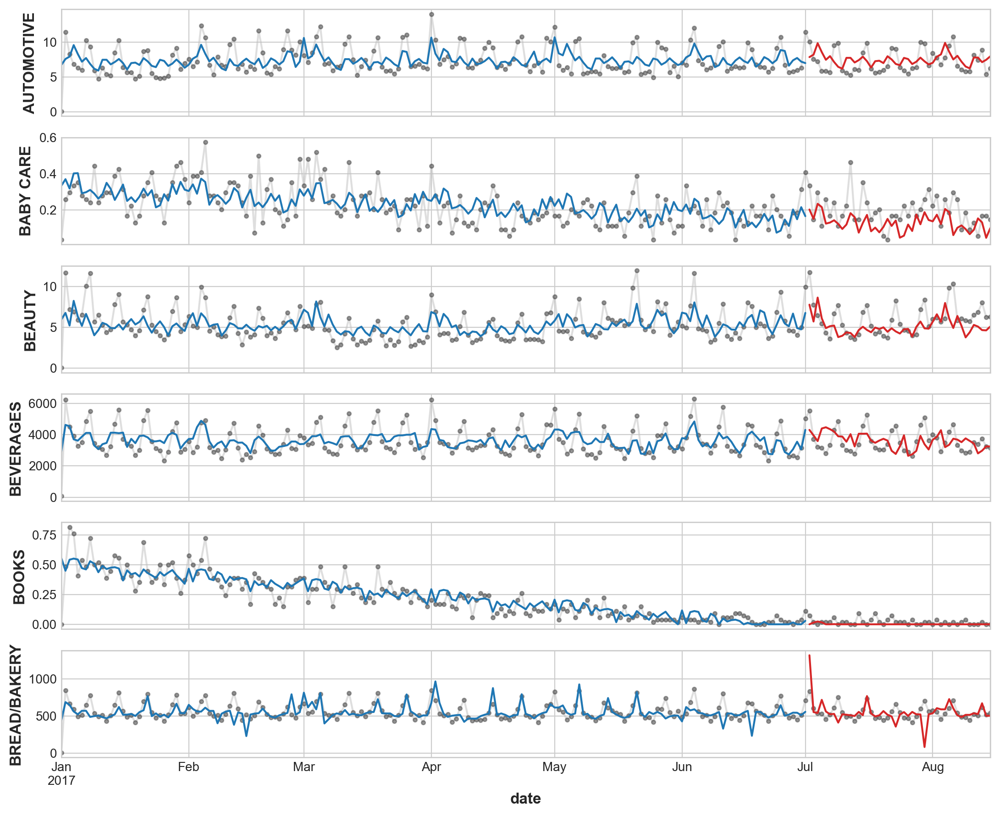

In [33]:
# Boosted Hybrid
# Try different combinations of the algorithms above
model_test = BoostedHybrid(model_1=Ridge(),
                           model_2=KNeighborsRegressor())


model_test.fit(X1_train, X2_train, y_train)
y_fit  = model_test.predict(X1_train, X2_train).clip(0.0)
y_pred = model_test.predict(X1_valid, X2_valid).clip(0.0)

families = y.columns[0:6]

axs = y.loc(axis=1)[families].plot(subplots=True, sharex=True, figsize=(11, 9), **plot_params, alpha=0.5)
_   = y_fit.loc(axis=1)[families].plot(subplots=True, sharex=True, color='C0', ax=axs)
_   = y_pred.loc(axis=1)[families].plot(subplots=True, sharex=True, color='C3', ax=axs)
for ax, family in zip(axs, families):
    ax.legend([])
    ax.set_ylabel(family)

del ax, axs, model_test, y_fit, y_pred, families


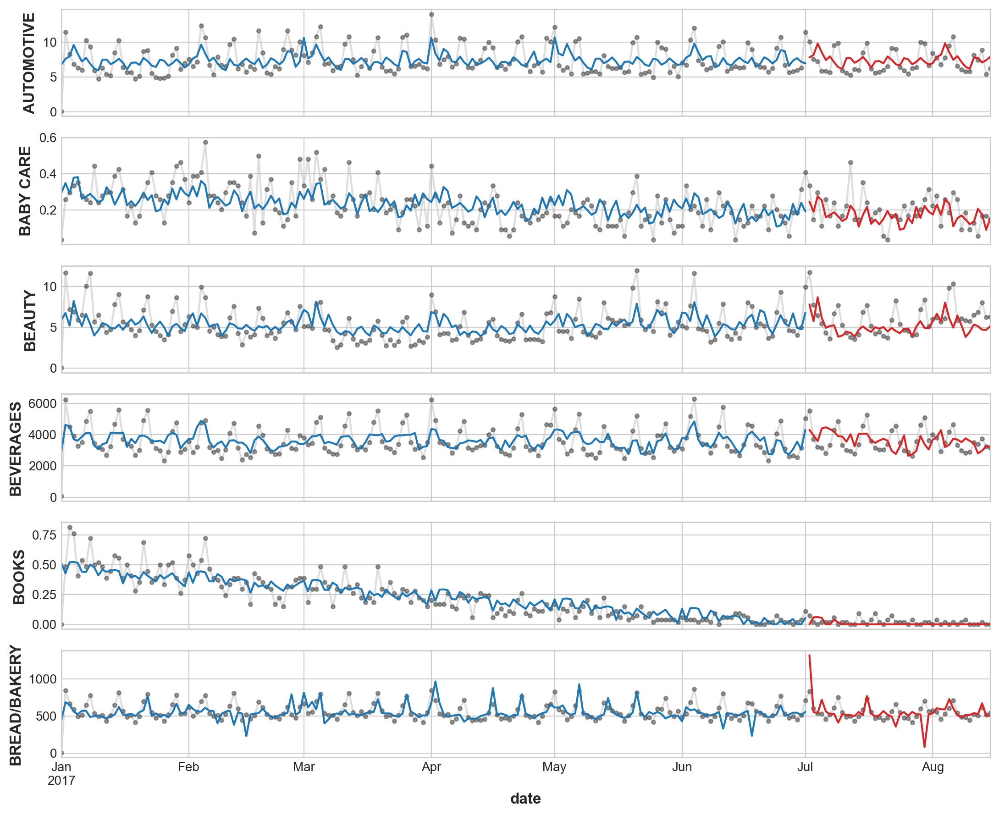

In [34]:
# Boosted Hybrid
# Try different combinations of the algorithms above
model_test = BoostedHybrid(model_1=Lasso(),
                           model_2=KNeighborsRegressor())


model_test.fit(X1_train, X2_train, y_train)
y_fit  = model_test.predict(X1_train, X2_train).clip(0.0)
y_pred = model_test.predict(X1_valid, X2_valid).clip(0.0)

families = y.columns[0:6]

axs = y.loc(axis=1)[families].plot(subplots=True, sharex=True, figsize=(11, 9), **plot_params, alpha=0.5)
_   = y_fit.loc(axis=1)[families].plot(subplots=True, sharex=True, color='C0', ax=axs)
_   = y_pred.loc(axis=1)[families].plot(subplots=True, sharex=True, color='C3', ax=axs)
for ax, family in zip(axs, families):
    ax.legend([])
    ax.set_ylabel(family)

del ax, axs, model_test, y_fit, y_pred, families


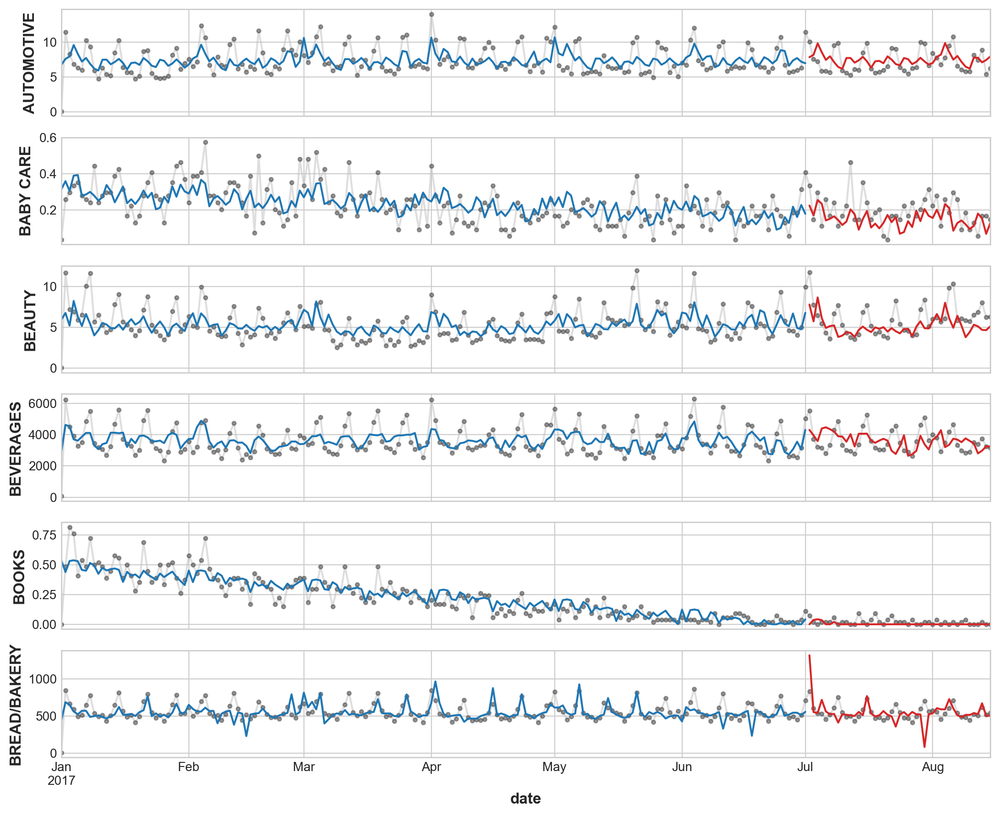

In [35]:
# Boosted Hybrid
# Try different combinations of the algorithms above
model_test = BoostedHybrid(model_1=ElasticNet(),
                           model_2=KNeighborsRegressor())


model_test.fit(X1_train, X2_train, y_train)
y_fit  = model_test.predict(X1_train, X2_train).clip(0.0)
y_pred = model_test.predict(X1_valid, X2_valid).clip(0.0)

families = y.columns[0:6]

axs = y.loc(axis=1)[families].plot(subplots=True, sharex=True, figsize=(11, 9), **plot_params, alpha=0.5)
_   = y_fit.loc(axis=1)[families].plot(subplots=True, sharex=True, color='C0', ax=axs)
_   = y_pred.loc(axis=1)[families].plot(subplots=True, sharex=True, color='C3', ax=axs)
for ax, family in zip(axs, families):
    ax.legend([])
    ax.set_ylabel(family)

del ax, axs, model_test, y_fit, y_pred, families


In [36]:
del y_train, y_valid, X1_train, X1_valid, X2_train, X2_valid
del y, dp, X_1, le, X_2
del family, family_sales, store_sales

---

### VI. Forecasting with Machine Learning

#### Background & Examples

In [4]:
N = 20
ts = pd.Series(np.arange(N),
               index = pd.period_range(start = '2010', freq = 'A', periods = N, name = 'Year'),
               dtype = pd.Int8Dtype)

X = pd.DataFrame({'y_lag_2': ts.shift(2),
                  'y_lag_3': ts.shift(3),
                  'y_lag_4': ts.shift(4),
                  'y_lag_5': ts.shift(5),
                  'y_lag_6': ts.shift(6)})

y = pd.DataFrame({'y_step_3': ts.shift(-2),
                  'y_step_2': ts.shift(-1),
                  'y_step_1': ts})

data = pd.concat({'Targets': y,
                  'Features': X}, 
                  axis = 1)

del N, ts, X, y

display(data.head(10).style.set_properties(['Targets'], **{'background-color': 'LavenderBlush'}).set_properties(['Features'], **{'background-color':'Lavender'}))

del data


In [ ]:
def plot_multistep(y, every=1, ax=None, palette_kwargs=None):

    palette_kwargs_ = dict(palette='husl', n_colors=16, desat=None)
    if palette_kwargs is not None:
        palette_kwargs_.update(palette_kwargs)
    palette = sns.color_palette(**palette_kwargs_)
    
    if ax is None:
        fig, ax = plt.subplots()
    ax.set_prop_cycle(plt.cycler('color', palette))
    
    for date, preds in y[::every].iterrows():
        preds.index = pd.period_range(start=date, periods=len(preds))
        preds.plot(ax=ax)
    return ax


In [7]:
flu_trends = pd.read_csv(local_datapath + '/flu-trends.csv')
flu_trends.set_index(pd.PeriodIndex(flu_trends.Week, freq='W'), inplace=True)
flu_trends.drop("Week", axis=1, inplace=True)

flu_trends.head()

,AInfluenza,AcuteBronchitis,BodyTemperature,BraunThermoscan,BreakAFever,Bronchitis,ChestCold,ColdAndFlu,ColdOrFlu,ColdVersusFlu,...,TreatingTheFlu,TreatmentForFlu,TreatmentForTheFlu,Tussin,Tussionex,TypeAInfluenza,UpperRespiratory,WalkingPneumonia,WhatToDoIfYouHaveTheFlu,FluVisits
Week,,,,,,,,,,,,,,,,,,,,,
2009-06-29/2009-07-05,36,20,43,27,11,22,16,7,3,8,...,16,6,13,25,34,30,25,24,15,180
2009-07-06/2009-07-12,25,19,40,31,10,21,11,6,8,8,...,16,7,8,27,32,27,28,29,9,115
2009-07-13/2009-07-19,24,30,45,20,12,20,20,6,6,8,...,16,6,9,24,28,25,25,25,9,132
2009-07-20/2009-07-26,23,19,40,15,10,19,12,7,10,15,...,8,5,12,21,26,26,29,24,13,109
2009-07-27/2009-08-02,27,21,44,20,11,19,17,8,10,15,...,8,8,12,33,29,21,27,30,9,120


In [7]:
def make_lags(ts, lags, lead_time = 1):
    return pd.concat({f'y_lag_{i}': ts.shift(i) for i in range(lead_time, lags + lead_time)}, axis=1)

def make_multistep_target(ts, steps):
    return pd.concat({f'y_step_{i+1}': ts.shift(-i) for i in range(steps)}, axis=1)


In [ ]:
y = flu_trends.FluVisits.copy()
X = make_lags(y, lags = 4).fillna(0.0)

y = make_multistep_target(y, steps=8).dropna()

y, X = y.align(X, join='inner', axis=0)


In [17]:
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size = 0.25, 
                                                    shuffle = False)

model = LinearRegression().fit(X_train, y_train)

y_fit  = pd.DataFrame(model.predict(X_train), index = X_train.index, columns = y.columns)
y_pred = pd.DataFrame(model.predict(X_test),  index = X_test.index, columns = y.columns)


In [21]:
train_rmse = root_mean_squared_error(y_train, y_fit)
test_rmse  = root_mean_squared_error(y_test, y_pred)

print((f'Train RMSE: {train_rmse:.2f}\n' f'Test RMSE: {test_rmse:.2f}'))
del train_rmse, test_rmse

Train RMSE: 389.12
Test RMSE: 582.33


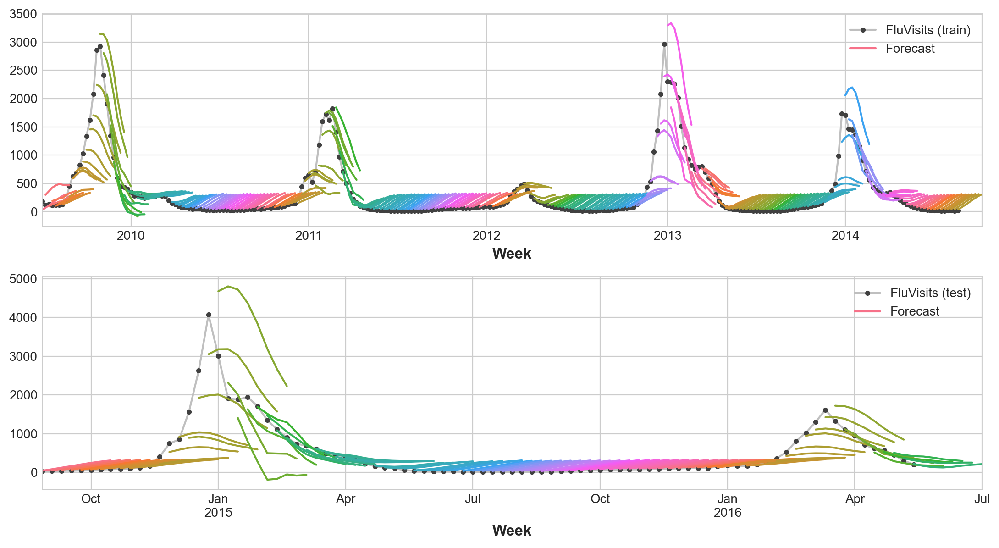

<Figure size 1100x400 with 0 Axes>

In [24]:
palette = dict(palette='husl', n_colors=64)

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(11,6))

ax1 = flu_trends.FluVisits[y_fit.index].plot(**plot_params, ax=ax1)
ax1 = plot_multistep(y_fit, ax=ax1, palette_kwargs=palette)
_   = ax1.legend(['FluVisits (train)', 'Forecast'])

ax2 = flu_trends.FluVisits[y_pred.index].plot(**plot_params, ax=ax2)
ax2 = plot_multistep(y_pred, ax=ax2, palette_kwargs=palette)
_   = ax2.legend(['FluVisits (test)', 'Forecast'])

for ax in [ax1,ax2]: ax.grid(True)

plt.tight_layout()
plt.show()
plt.clf()

del fig, ax1, ax2, palette

In [26]:
model = MultiOutputRegressor(XGBRegressor()).fit(X_train, y_train)

y_fit  = pd.DataFrame(model.predict(X_train), index = X_train.index, columns = y.columns)
y_pred = pd.DataFrame(model.predict(X_test),  index = X_test.index,  columns = y.columns)


train_rmse = root_mean_squared_error(y_train, y_fit)
test_rmse  = root_mean_squared_error(y_test, y_pred)

print((f'Train RMSE: {train_rmse:.2f}\n' f'Test RMSE: {test_rmse:.2f}'))
del train_rmse, test_rmse

Train RMSE: 1.19
Test RMSE: 494.52


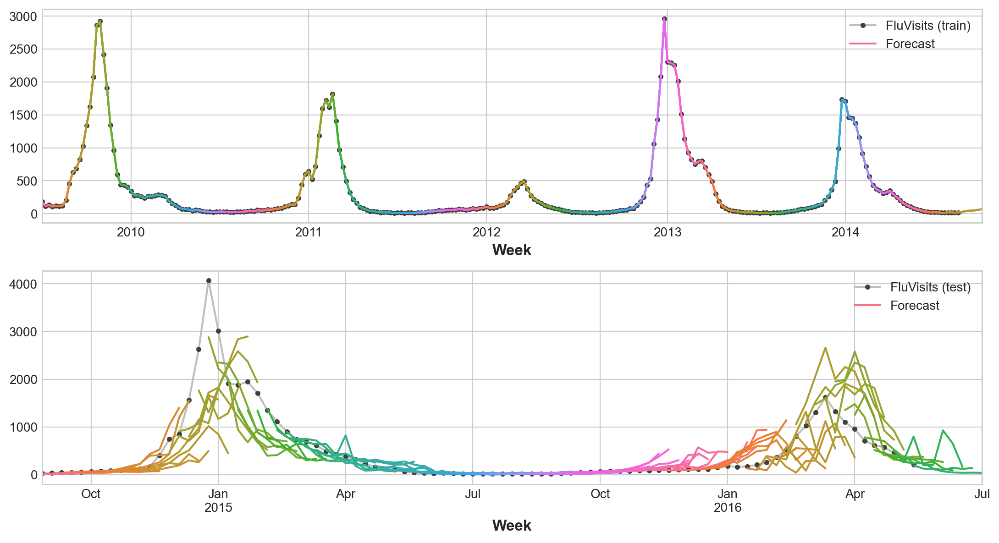

<Figure size 1100x400 with 0 Axes>

In [27]:
palette = dict(palette='husl', n_colors=64)

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(11,6))

ax1 = flu_trends.FluVisits[y_fit.index].plot(**plot_params, ax=ax1)
ax1 = plot_multistep(y_fit, ax=ax1, palette_kwargs=palette)
_   = ax1.legend(['FluVisits (train)', 'Forecast'])

ax2 = flu_trends.FluVisits[y_pred.index].plot(**plot_params, ax=ax2)
ax2 = plot_multistep(y_pred, ax=ax2, palette_kwargs=palette)
_   = ax2.legend(['FluVisits (test)', 'Forecast'])

for ax in [ax1,ax2]: ax.grid(True)

plt.tight_layout()
plt.show()
plt.clf()

del fig, ax1, ax2, palette

In [28]:
del model, flu_trends
del X, X_test, X_train
del y, y_test, y_train, y_fit, y_pred

#### Exercises

In [4]:
store_sales = pd.read_csv(local_datapath +'/train.csv', 
                          usecols = ['store_nbr','family','date','sales','onpromotion'],
                          dtype={'store_nbr': 'category',
                                 'family': 'category',
                                 'sales': 'float32',
                                 'onpromotion': 'uint32'}, 
                        parse_dates=['date'],
                        infer_datetime_format=True)
store_sales.date = store_sales.date.dt.to_period('D')
store_sales      = store_sales.set_index(['store_nbr','family','date']).sort_index()

family_sales = (store_sales.groupby(['family', 'date']).mean().unstack('family').loc['2017'])

test = pd.read_csv(local_datapath + '/test.csv', 
                   dtype={'store_nbr':'category',
                          'family':'category',
                          'onpromotion':'uint32'},
                    parse_dates=['date'], 
                    infer_datetime_format = True)

test['date'] = test.date.dt.to_period('D')
test         = test.set_index(['store_nbr', 'family', 'date']).sort_index()


In [8]:
print("Training Data", "\n" + "-" * 13 + "\n", store_sales)
print("\n")
print("Test Data", "\n" + "-" * 9 + "\n", test)

Training Data 
-------------
                                      sales  onpromotion
store_nbr family     date                              
1         AUTOMOTIVE 2013-01-01   0.000000            0
                     2013-01-02   2.000000            0
                     2013-01-03   3.000000            0
                     2013-01-04   3.000000            0
                     2013-01-05   5.000000            0
...                                    ...          ...
9         SEAFOOD    2017-08-11  23.830999            0
                     2017-08-12  16.859001            4
                     2017-08-13  20.000000            0
                     2017-08-14  17.000000            0
                     2017-08-15  16.000000            0

[3000888 rows x 2 columns]


Test Data 
---------
                                       id  onpromotion
store_nbr family     date                            
1         AUTOMOTIVE 2017-08-16  3000888            0
                     2017-08

In [9]:
y = family_sales.loc[:, 'sales']
X = make_lags(y, lags = 4).dropna()
y = make_multistep_target(y, steps=16).dropna()

y, X = y.align(X, join='inner', axis=0)

In [10]:
le = LabelEncoder()
X = (X.stack('family').reset_index('family').assign(family=lambda x: le.fit_transform(x.family)))
y = y.stack('family')

y

y_step_1     y_step_2     y_step_3  \
date       family                                                              
2017-01-05 AUTOMOTIVE                     6.333333     6.018518    10.259259   
           BABY CARE                      0.351852     0.277778     0.259259   
           BEAUTY                         5.925926     6.518518    10.037037   
           BEVERAGES                   3258.796387  3507.277832  4848.518555   
           BOOKS                          0.407407     0.537037     0.481481   
...                                            ...          ...          ...   
2017-07-31 POULTRY                      364.955658   403.601349   377.313995   
           PREPARED FOODS                84.698647    87.836800    88.735970   
           PRODUCE                     2257.140625  2609.180176  3122.895752   
           SCHOOL AND OFFICE SUPPLIES    30.111111    49.333332    57.481480   
           SEAFOOD                       20.488333    20.346851    20.801037   

                                          y_step_4     y_step_5     y_step_6  \
date       family                                                              
2017-01-05 AUTOMOTIVE                     9.388889     5.944445     4.777778   
           BABY CARE                      0.240741     0.444444     0.240741   
           BEAUTY                        11.611111     5.648148     6.500000   
           BEVERAGES                   5503.647949  3448.203613  3171.740723   
           BOOKS                          0.722222     0.500000     0.518519   
...                                            ...          ...          ...   
2017-07-31 POULTRY                      316.436096   533.497009   416.454041   
           PREPARED FOODS                77.172997    91.886765   100.384964   
           PRODUCE                     1792.220947  2079.319336  2418.970215   
           SCHOOL AND OFFICE SUPPLIES    51.907406    63.222221    85.203705   
           SEAFOOD                       17.116297    25.553965    24.209518   

                                          y_step_7     y_step_8     y_step_9  \
date       family                                                              
2017-01-05 AUTOMOTIVE                     6.314815     5.388889     5.240741   
           BABY CARE                      0.277778     0.296296     0.296296   
           BEAUTY                         5.277778     4.370370     4.703704   
           BEVERAGES                   3046.870361  2693.722168  3226.037109   
           BOOKS                          0.481481     0.388889     0.444444   
...                                            ...          ...          ...   
2017-07-31 POULTRY                      464.596558   344.051758   313.780884   
           PREPARED FOODS               102.248146    86.627441    77.344131   
           PRODUCE                     2675.105957  2111.133301  2168.535400   
           SCHOOL AND OFFICE SUPPLIES   100.277779    64.407410    59.759258   
           SEAFOOD                       23.512852    18.419851    18.481131   

                                         y_step_10    y_step_11    y_step_12  \
date       family                                                              
2017-01-05 AUTOMOTIVE                     8.500000    10.259259     6.407407   
           BABY CARE                      0.388889     0.425926     0.314815   
           BEAUTY                         7.777778     9.037037     5.648148   
           BEVERAGES                   4667.296387  5580.611328  3700.370361   
           BOOKS                          0.574074     0.555556     0.388889   
...                                            ...          ...          ...   
2017-07-31 POULTRY                      305.270233   278.819885   468.857391   
           PREPARED FOODS                84.796539    78.791443    96.286926   
           PRODUCE                     2663.076416  1670.264893  2198.854492   
           SCHOOL AND OFFICE SUPPLIES  

In [12]:
model = RegressorChain(XGBRegressor()).fit(X, y)

y_pred = pd.DataFrame(model.predict(X), 
                      index = y.index, 
                      columns = y.columns).clip(0.0)



AttributeError: 'super' object has no attribute '__sklearn_tags__'

In [13]:
FAMILY = 'BEAUTY'
START = '2017-04-01'
EVERY = 16

y_pred_ = y_pred.xs(FAMILY, level='family', axis=0).loc[START:]
y_ = family_sales.loc[START:, 'sales'].loc[:, FAMILY]

fig, ax = plt.subplots(1, 1, figsize=(11, 4))
ax = y_.plot(**plot_params, ax=ax, alpha=0.5)
ax = plot_multistep(y_pred_, ax=ax, every=EVERY)
_ = ax.legend([FAMILY, FAMILY + ' Forecast'])

NameError: name 'y_pred' is not defined

In [14]:
del model, X, y, le, 
del FAMILY, START, EVERY#, y_pred, y_, ax, _
del test, family_sales, store_sales

---